# Import library

In [1]:
import copy
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn import metrics
import pickle


# Load data

In [2]:
df = pd.read_csv('/kaggle/input/car-price-vn/data.csv')
df_car = pd.read_json('/kaggle/input/new-car/page_0_350.json')
# df_car = pd.read_json('/kaggle/input/preview/predict.json')

# Data overview

In [3]:
df_car.head()

,name,price,type,assemble_place
0,Skoda Kodiaq Ambition 1.4 TSI Tur - 2023,1 Tỷ 169 Triệu,Xe mới 2023,Xe nhập khẩu
1,Mitsubishi Xpander 1.5 AT - 2023,534 Triệu,Xe mới 2023,Xe nhập khẩu
2,MG ZS Luxury 1.5 AT 2WD - 2023,530 Triệu,Xe mới 2023,Xe nhập khẩu
3,Volkswagen Teramont 2.0 AT - 2023,2 Tỷ 99 Triệu,Xe mới 2023,Xe nhập khẩu
4,Lexus LX 600 Vip - 2023,9 Tỷ 610 Triệu,Xe mới 2023,Xe nhập khẩu


In [4]:
def describle_data(df):
    print('Shape of data:\n', df.shape)
    print('--'*20)
    print('Columns of data: \n', df.columns)
    print('--'*20)
    print('Data types of data: \n', df.dtypes)
    print('--'*20)
    print('Missing values of data: \n', df.isna().sum())
    print('--'*20)
    print('Describe data: \n', df.describe())
    print('--'*20)
    print('Info data: \n', df.info())
describle_data(df)

Shape of data:
 (26956, 11)
----------------------------------------
Columns of data: 
 Index(['car_name', 'year', 'price', 'assemble_place', 'series', 'driven kms',
       'num_of_door', 'num_of_seat', 'engine_type', 'transmission', 'url'],
      dtype='object')
----------------------------------------
Data types of data: 
 car_name           object
year               object
price              object
assemble_place     object
series             object
driven kms        float64
num_of_door       float64
num_of_seat       float64
engine_type        object
transmission       object
url                object
dtype: object
----------------------------------------
Missing values of data: 
 car_name          38
year              11
price             11
assemble_place    11
series            11
driven kms        11
num_of_door       11
num_of_seat       11
engine_type       11
transmission      11
url               11
dtype: int64
----------------------------------------
Describe data: 
     

In [5]:
describle_data(df_car)

Shape of data:
 (5740, 4)
----------------------------------------
Columns of data: 
 Index(['name', 'price', 'type', 'assemble_place'], dtype='object')
----------------------------------------
Data types of data: 
 name              object
price             object
type              object
assemble_place    object
dtype: object
----------------------------------------
Missing values of data: 
 name              0
price             0
type              0
assemble_place    0
dtype: int64
----------------------------------------
Describe data: 
                                        name        price           type  \
count                                  5740         5740           5740   
unique                                  730         1061              6   
top      Ford Ranger XLS 2.0L 4x2 AT - 2023   799 Triệu    Xe mới 2023    
freq                                    152           75           5295   

       assemble_place  
count            5740  
unique              2  
top 

# Xóa bỏ những xe bị trùng lặp

In [6]:
df_car

,name,price,type,assemble_place
0,Skoda Kodiaq Ambition 1.4 TSI Tur - 2023,1 Tỷ 169 Triệu,Xe mới 2023,Xe nhập khẩu
1,Mitsubishi Xpander 1.5 AT - 2023,534 Triệu,Xe mới 2023,Xe nhập khẩu
2,MG ZS Luxury 1.5 AT 2WD - 2023,530 Triệu,Xe mới 2023,Xe nhập khẩu
3,Volkswagen Teramont 2.0 AT - 2023,2 Tỷ 99 Triệu,Xe mới 2023,Xe nhập khẩu
4,Lexus LX 600 Vip - 2023,9 Tỷ 610 Triệu,Xe mới 2023,Xe nhập khẩu
...,...,...,...,...
5735,Hyundai SantaFe Tiêu chuẩn 2.2L - 2023,1 Tỷ 54 Triệu,Xe mới 2023,Xe lắp ráp trong nước
5736,Hyundai SantaFe Cao cấp 2.5L HTRAC - 2023,1 Tỷ 132 Triệu,Xe mới 2023,Xe lắp ráp trong nước
5737,Hyundai SantaFe Tiêu chuẩn 2.5L - 2023,954 Triệu,Xe mới 2023,Xe lắp ráp trong nước
5738,Hyundai Tucson 1.6 AT Turbo HTRAC Đặc biệt - ...,885 Triệu,Xe mới 2023,Xe lắp ráp trong nước


In [7]:
df.drop_duplicates(subset=['url'], inplace=True)

describle_data(df)

Shape of data:
 (25157, 11)
----------------------------------------
Columns of data: 
 Index(['car_name', 'year', 'price', 'assemble_place', 'series', 'driven kms',
       'num_of_door', 'num_of_seat', 'engine_type', 'transmission', 'url'],
      dtype='object')
----------------------------------------
Data types of data: 
 car_name           object
year               object
price              object
assemble_place     object
series             object
driven kms        float64
num_of_door       float64
num_of_seat       float64
engine_type        object
transmission       object
url                object
dtype: object
----------------------------------------
Missing values of data: 
 car_name          35
year               1
price              1
assemble_place     1
series             1
driven kms         1
num_of_door        1
num_of_seat        1
engine_type        1
transmission       1
url                1
dtype: int64
----------------------------------------
Describe data: 
     

# Chuyển đổi kiểu dữ liệu cho các cột year, price sang kiểu số thực để có thể thực hiện các phép tính toán

Year

In [8]:
def process_year_colum(year):
    if year.isdigit():
        return float(year)
    else:
        return 0
df['year'] = df['year'].astype(str).apply(process_year_colum)
df
describle_data(df)

Shape of data:
 (25157, 11)
----------------------------------------
Columns of data: 
 Index(['car_name', 'year', 'price', 'assemble_place', 'series', 'driven kms',
       'num_of_door', 'num_of_seat', 'engine_type', 'transmission', 'url'],
      dtype='object')
----------------------------------------
Data types of data: 
 car_name           object
year              float64
price              object
assemble_place     object
series             object
driven kms        float64
num_of_door       float64
num_of_seat       float64
engine_type        object
transmission       object
url                object
dtype: object
----------------------------------------
Missing values of data: 
 car_name          35
year               0
price              1
assemble_place     1
series             1
driven kms         1
num_of_door        1
num_of_seat        1
engine_type        1
transmission       1
url                1
dtype: int64
----------------------------------------
Describe data: 
     

Price

In [9]:
df.isna().sum()
df.dropna(subset=['car_name'], inplace=True)
df

,car_name,year,price,assemble_place,series,driven kms,num_of_door,num_of_seat,engine_type,transmission,url
0,LandRover Range Rover HSE 3.0,2015.0,2 Tỷ 700 Triệu,Nhập khẩu,SUV,65000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-landrover-range_rover-h...
1,Mitsubishi Outlander 2.0 CVT Premium,2018.0,666 Triệu,Lắp ráp trong nước,SUV,50000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-mitsubishi-outlander-2....
2,Mazda 3 1.5L Luxury,2019.0,490 Triệu,Lắp ráp trong nước,Sedan,51000.0,4.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mazda-3-1.5l-luxury-201...
3,Mazda 2 1.5 AT,2015.0,365 Triệu,Lắp ráp trong nước,Sedan,38000.0,4.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mazda-2-1.5-at-2015-491...
4,Suzuki Swift GLX 1.2 AT,2021.0,565 Triệu,Nhập khẩu,Hatchback,6000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-suzuki-swift-glx-1.2-at...
...,...,...,...,...,...,...,...,...,...,...,...
26898,Suzuki Swift GLX 1.2 AT,2021.0,515 Triệu,Nhập khẩu,Hatchback,3000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-suzuki-swift-glx-1.2-at...
26899,Hyundai i10 Grand 1.2 AT,2020.0,385 Triệu,Lắp ráp trong nước,Hatchback,20000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-hyundai-i10-grand-1.2-a...
26900,Toyota Rush 1.5S AT,2019.0,679 Triệu,Nhập khẩu,SUV,60000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-toyota-rush-1.5s-at-201...
26901,Lexus GX 460,2010.0,1 Tỷ 500 Triệu,Nhập khẩu,SUV,60000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-lexus-gx-460-2010-4557366


In [10]:
df_car

,name,price,type,assemble_place
0,Skoda Kodiaq Ambition 1.4 TSI Tur - 2023,1 Tỷ 169 Triệu,Xe mới 2023,Xe nhập khẩu
1,Mitsubishi Xpander 1.5 AT - 2023,534 Triệu,Xe mới 2023,Xe nhập khẩu
2,MG ZS Luxury 1.5 AT 2WD - 2023,530 Triệu,Xe mới 2023,Xe nhập khẩu
3,Volkswagen Teramont 2.0 AT - 2023,2 Tỷ 99 Triệu,Xe mới 2023,Xe nhập khẩu
4,Lexus LX 600 Vip - 2023,9 Tỷ 610 Triệu,Xe mới 2023,Xe nhập khẩu
...,...,...,...,...
5735,Hyundai SantaFe Tiêu chuẩn 2.2L - 2023,1 Tỷ 54 Triệu,Xe mới 2023,Xe lắp ráp trong nước
5736,Hyundai SantaFe Cao cấp 2.5L HTRAC - 2023,1 Tỷ 132 Triệu,Xe mới 2023,Xe lắp ráp trong nước
5737,Hyundai SantaFe Tiêu chuẩn 2.5L - 2023,954 Triệu,Xe mới 2023,Xe lắp ráp trong nước
5738,Hyundai Tucson 1.6 AT Turbo HTRAC Đặc biệt - ...,885 Triệu,Xe mới 2023,Xe lắp ráp trong nước


In [11]:
df_car['car_name'] = df_car['name'].str.strip()
df['car_name'] = df['car_name'].str.strip()

In [12]:
df

,car_name,year,price,assemble_place,series,driven kms,num_of_door,num_of_seat,engine_type,transmission,url
0,LandRover Range Rover HSE 3.0,2015.0,2 Tỷ 700 Triệu,Nhập khẩu,SUV,65000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-landrover-range_rover-h...
1,Mitsubishi Outlander 2.0 CVT Premium,2018.0,666 Triệu,Lắp ráp trong nước,SUV,50000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-mitsubishi-outlander-2....
2,Mazda 3 1.5L Luxury,2019.0,490 Triệu,Lắp ráp trong nước,Sedan,51000.0,4.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mazda-3-1.5l-luxury-201...
3,Mazda 2 1.5 AT,2015.0,365 Triệu,Lắp ráp trong nước,Sedan,38000.0,4.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mazda-2-1.5-at-2015-491...
4,Suzuki Swift GLX 1.2 AT,2021.0,565 Triệu,Nhập khẩu,Hatchback,6000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-suzuki-swift-glx-1.2-at...
...,...,...,...,...,...,...,...,...,...,...,...
26898,Suzuki Swift GLX 1.2 AT,2021.0,515 Triệu,Nhập khẩu,Hatchback,3000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-suzuki-swift-glx-1.2-at...
26899,Hyundai i10 Grand 1.2 AT,2020.0,385 Triệu,Lắp ráp trong nước,Hatchback,20000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-hyundai-i10-grand-1.2-a...
26900,Toyota Rush 1.5S AT,2019.0,679 Triệu,Nhập khẩu,SUV,60000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-toyota-rush-1.5s-at-201...
26901,Lexus GX 460,2010.0,1 Tỷ 500 Triệu,Nhập khẩu,SUV,60000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-lexus-gx-460-2010-4557366


In [13]:
df_car

,name,price,type,assemble_place,car_name
0,Skoda Kodiaq Ambition 1.4 TSI Tur - 2023,1 Tỷ 169 Triệu,Xe mới 2023,Xe nhập khẩu,Skoda Kodiaq Ambition 1.4 TSI Tur - 2023
1,Mitsubishi Xpander 1.5 AT - 2023,534 Triệu,Xe mới 2023,Xe nhập khẩu,Mitsubishi Xpander 1.5 AT - 2023
2,MG ZS Luxury 1.5 AT 2WD - 2023,530 Triệu,Xe mới 2023,Xe nhập khẩu,MG ZS Luxury 1.5 AT 2WD - 2023
3,Volkswagen Teramont 2.0 AT - 2023,2 Tỷ 99 Triệu,Xe mới 2023,Xe nhập khẩu,Volkswagen Teramont 2.0 AT - 2023
4,Lexus LX 600 Vip - 2023,9 Tỷ 610 Triệu,Xe mới 2023,Xe nhập khẩu,Lexus LX 600 Vip - 2023
...,...,...,...,...,...
5735,Hyundai SantaFe Tiêu chuẩn 2.2L - 2023,1 Tỷ 54 Triệu,Xe mới 2023,Xe lắp ráp trong nước,Hyundai SantaFe Tiêu chuẩn 2.2L - 2023
5736,Hyundai SantaFe Cao cấp 2.5L HTRAC - 2023,1 Tỷ 132 Triệu,Xe mới 2023,Xe lắp ráp trong nước,Hyundai SantaFe Cao cấp 2.5L HTRAC - 2023
5737,Hyundai SantaFe Tiêu chuẩn 2.5L - 2023,954 Triệu,Xe mới 2023,Xe lắp ráp trong nước,Hyundai SantaFe Tiêu chuẩn 2.5L - 2023
5738,Hyundai Tucson 1.6 AT Turbo HTRAC Đặc biệt - ...,885 Triệu,Xe mới 2023,Xe lắp ráp trong nước,Hyundai Tucson 1.6 AT Turbo HTRAC Đặc biệt - 2023


In [14]:
def process_price(price):
    try:
        if price.find('Tỷ') != -1:
            ty= price.split('Tỷ')[0]
            trieu = price.split('Tỷ')[1]
            trieu = trieu.split('Triệu')[0]
            return float(ty)*1000000000 + float(trieu)*1000000
        elif price.find('Triệu') != -1:
            trieu = price.split('Triệu')[0]
            trieu = trieu.replace(' ','')
            return float(trieu)*1000000
        else:
            return 0
    except:
        return 0
df['price'] = df['price'].astype(str).apply(process_price)
df_car['price']= df_car['price'].astype(str).apply(process_price)

In [15]:
df['driven kms'].describe()
# lấy ra các xe có số km đi được nhỏ hơn 1000km
print(df[df['driven kms'] < 1000]['url'])

57       https://bonbanh.com/xe-mercedes_benz-c_class-c...
64       https://bonbanh.com/xe-mercedes_benz-c_class-c...
89       https://bonbanh.com/xe-mercedes_benz-c_class-c...
153      https://bonbanh.com/xe-gaz-khac-sadko-2002-493...
169      https://bonbanh.com/xe-kia-morning-slx-1.0-at-...
                               ...                        
26814    https://bonbanh.com/xe-mazda-3-1.5-at-2015-483...
26829    https://bonbanh.com/xe-toyota-camry-2.5hv-2022...
26889    https://bonbanh.com/xe-mercedes_benz-glc-300-4...
26890    https://bonbanh.com/xe-mercedes_benz-e_class-e...
26894    https://bonbanh.com/xe-toyota-venza-2.7-2009-4...
Name: url, Length: 627, dtype: object


In [16]:
#drop all rows with driven kms < 1000, nan values in all columns
df.drop(df[df['driven kms'] < 1000].index, inplace=True)
df.dropna(inplace=True)
df.isna().sum()

car_name          0
year              0
price             0
assemble_place    0
series            0
driven kms        0
num_of_door       0
num_of_seat       0
engine_type       0
transmission      0
url               0
dtype: int64

In [17]:
df_car['price'].describe()


count    5.740000e+03
mean     1.645878e+09
std      2.695901e+09
min      0.000000e+00
25%      6.190000e+08
50%      8.590000e+08
75%      1.456250e+09
max      6.350000e+10
Name: price, dtype: float64

# Xử lý các cột dạng nhãn

Car_name có hai phần là hãng xe và tên xe, ta sẽ tách ra thành hai cột là brand và model


In [18]:
df['brand'] = df['car_name'].str.split().str[0]


In [19]:
df['brand'].value_counts()

brand
Toyota        4673
Hyundai       2775
Mercedes      2732
Kia           2628
Ford          2198
              ... 
Haima            1
Scion            1
Dothanh          1
B                1
Brilliance       1
Name: count, Length: 84, dtype: int64

In [20]:
df.head()

,car_name,year,price,assemble_place,series,driven kms,num_of_door,num_of_seat,engine_type,transmission,url,brand
0,LandRover Range Rover HSE 3.0,2015.0,2.700000e+09,Nhập khẩu,SUV,65000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-landrover-range_rover-h...,LandRover
1,Mitsubishi Outlander 2.0 CVT Premium,2018.0,6.660000e+08,Lắp ráp trong nước,SUV,50000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-mitsubishi-outlander-2....,Mitsubishi
2,Mazda 3 1.5L Luxury,2019.0,4.900000e+08,Lắp ráp trong nước,Sedan,51000.0,4.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mazda-3-1.5l-luxury-201...,Mazda
3,Mazda 2 1.5 AT,2015.0,3.650000e+08,Lắp ráp trong nước,Sedan,38000.0,4.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mazda-2-1.5-at-2015-491...,Mazda
4,Suzuki Swift GLX 1.2 AT,2021.0,5.650000e+08,Nhập khẩu,Hatchback,6000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-suzuki-swift-glx-1.2-at...,Suzuki


# Xử lý các dữ liệu bị thiếu hoặc sai


Xử lý cột year

In [21]:
car_before_1990 = df[df['year'] < 1990]
print('Number of car before 1990: ', car_before_1990.shape[0])
print('Number of car before 1990: ', car_before_1990['year'].value_counts())

Number of car before 1990:  197
Number of car before 1990:  year
0.0      195
200.0      1
700.0      1
Name: count, dtype: int64


Điền các giá trị sai trong cột year bằng giá trị xuất hiện nhiều nhất trong cột year

In [22]:
df['year'] = df['year'].apply(lambda x: df['year'].value_counts().index[0] if x < 1990 else x)


Cột price: các giá trị bằng = 0 sẽ được thay thế bằng giá trung bình của các xe sản xuất trong năm đó

In [23]:
df['price'] = df['price'].apply(lambda x: df[df['year'] == x]['price'].mean() if x == 0 else x)
df_car['price'].describe()

count    5.740000e+03
mean     1.645878e+09
std      2.695901e+09
min      0.000000e+00
25%      6.190000e+08
50%      8.590000e+08
75%      1.456250e+09
max      6.350000e+10
Name: price, dtype: float64

Cột num_of_door
Thông thường các xe có tối đa 5 - 6 cửa, với những giá trị sai ta sẽ điền bằng giá trị xuất hiện nhiều nhất trong cột num_of_door

In [24]:
df['num_of_door'] = df['num_of_door'].apply(lambda x: df['num_of_door'].value_counts().index[0] if x > 6 else x)

Cột brand

In [25]:
df['brand'].value_counts()

brand
Toyota        4673
Hyundai       2775
Mercedes      2732
Kia           2628
Ford          2198
              ... 
Haima            1
Scion            1
Dothanh          1
B                1
Brilliance       1
Name: count, Length: 84, dtype: int64

Cột brand có một số hãng có số lượng xe rất ít hoặc bị thiếu, ta sẽ gộp các hãng xe này thành một nhóm là 'other'
Nếu số xe của hãng đó nhỏ hơn 10 thì sẽ gộp vào nhóm 'Other'

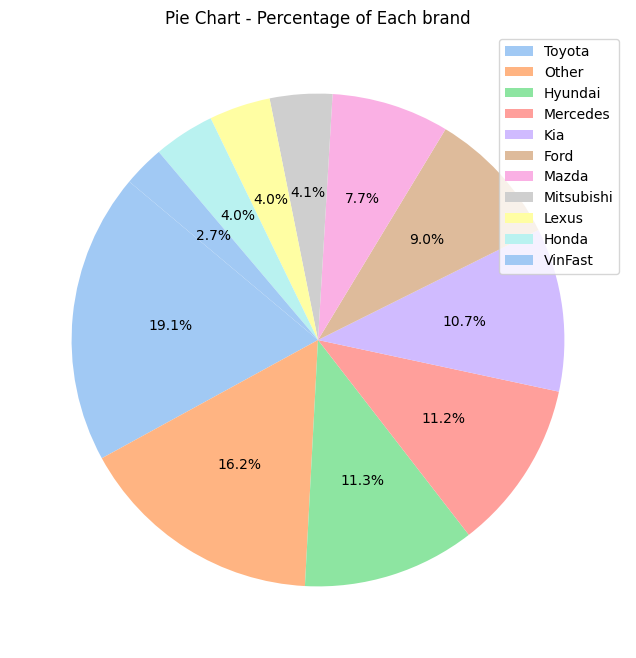

In [26]:
def draw_size_brand_pie(df,col,threshold):
    df_fake = copy.deepcopy(df)
    car_count = df_fake[col].value_counts()
    small_brands = car_count[car_count < threshold].index.tolist()
    df_fake[col] = df_fake[col].apply(lambda x: 'Other' if x in small_brands else x)
    df_fake[col].fillna('Other', inplace=True)
    brand_counts = df_fake[col].value_counts()
    total_brands = len(df_fake[col])
    brand_percentages = (brand_counts / total_brands) * 100

    # Create a dictionary to map brand names to average prices
    brand_avg_price = df_fake.groupby(col)['price'].mean().to_dict()

    # Get a categorical color palette
    palette = sns.color_palette('pastel', n_colors=len(brand_percentages))

    # Plotting
    plt.figure(figsize=(20, 8))
    colors = [palette[i] for i, brand in enumerate(brand_percentages.index)]
    plt.pie(brand_percentages, labels=None, autopct='%1.1f%%', startangle=140, colors=colors)

    # Adding legend
    plt.legend(brand_percentages.index, loc='upper right')

    # Adding title
    plt.title('Pie Chart - Percentage of Each ' + str(col))

    # Show the plot
    plt.show()
def draw_size_brand_linear(df,threshold):
    df_fake = copy.deepcopy(df)
    car_count = df_fake[col].value_counts()
    small_brands = car_count[car_count < threshold].index.tolist()
    df_fake[col] = df_fake[col].apply(lambda x: 'Other' if x in small_brands else x)
    df_fake[col].fillna('Other', inplace=True)
    
    brand_counts = df_fake[col].value_counts()
    total_brands = len(df_fake[col])
    brand_percentages = (brand_counts / total_brands) * 100

    # Plotting
    plt.figure(figsize=(10, 6))
    brand_percentages.plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title('Percentage of Each Car ' +str(col))
    plt.xlabel('Car Brand')
    plt.ylabel('Percentage')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
    plt.tight_layout()

    # Show the plot
    plt.show()
draw_size_brand_pie(df,'brand',600)

In [27]:
threshold = 100
car_count = df['brand'].value_counts()
small_brands = car_count[car_count < threshold].index.tolist()
df['brand'] = df['brand'].apply(lambda x: 'Other' if x in small_brands else x)
df['brand'].fillna('Other', inplace=True)
brand_counts = df['brand'].value_counts()
total_brands = len(df['brand'])
brand_percentages = (brand_counts / total_brands) * 100

In [28]:
# in ra tất cả brand
# sắp xếp theo thứ tự giảm dần về giá trung bình




In [29]:
# def car_band(x):
#     if x in ['Land', 'Lamborghini', 'Jaguar', 'BMW', 'Mercedes', 'Porsche','Jeep',
#        'Audi', 'Bentley','Mini','LandRover','Lexus','Maserati','Rolls','Ferrari','Aston','Lincoln','Maserati','Cadillac']:
#         return 'HIGH END CAR'    
#     elif x in ['Ford',
#             'Skoda',
#          'Mahindra',
#             'Force',
#        'Mitsubishi',
#            'Toyota',
#             'ISUZU',
#            'Volvo',
#           'Isuzu','Other']:
#         return 'MIDDLE RANGE CAR'
#     else:
#         return 'LOW END CAR'
# df['brand']=df['brand'].apply(car_band)
# def car_band(x):
#     if x in ['Rolls', 'Bentley', 'Ferrari','Lincoln','Porsche','LandRover','Lexus','Jeep']:
#         return 'LUXURY CAR'
#     elif x in ['Maserati', 'Cadillac', 'Lincoln', 'Mercedes', 'Audi', 'BMW', 'Volvo']:
#         return 'PREMIUM CAR'
#     elif x in ['VW', 'Seat', 'Ford', 'Opel','VinFast','Mazda','Honda','Hyundai','Kia','Chevrolet','Toyota','Suzuki','Nissan','Renault','Other']:
#         return 'VOLUME CAR'
#     else:
#         return 'LOW-PRICE CAR'
# def car_band(x):
#     if x in ['Rolls-Royce', 'Bentley', 'Lincoln', 'Land Rover', 'Porsche', 'Maserati', 'Lexus', 'Jeep', 'Cadillac']:
#         return 'LUXURY CAR'
#     elif x in ['Mini', 'BMW', 'Audi', 'Volvo', 'Mercedes-Benz', 'Infiniti', 'Jaguar','Other']:
#         return 'PREMIUM CAR'
#     elif x in ['Subaru', 'Volkswagen', 'Peugeot', 'Toyota', 'Ford', 'VinFast', 'Mazda', 'Hyundai', 'Honda']:
#         return 'VOLUME CAR'
#     else:
#         return 'LOW-PRICE CAR'
def car_band(x):
    if x in ['Rolls', 'Bentley', 'Lincoln', 'LandRover', 'Porsche', 'Maserati', 'Lexus', 'Jeep', 'Cadillac']:
        return 'LUXURY'
    elif x in ['Other', 'Volvo', 'Mercedes', 'Infiniti', 'Jaguar', 'Mini', 'BMW', 'Audi']:
        return 'PREMIUM'
    elif x in ['Subaru', 'Volkswagen', 'Peugeot', 'Toyota', 'Ford', 'VinFast', 'Mazda', 'Hyundai', 'Honda','MG','Mitsubishi']:
        return 'VOLUME'
    else:
        return 'LOWEND'

df['brand_segment'] = df['brand'].apply(car_band)

df['brand_segment'].value_counts()


brand_segment
VOLUME     14414
PREMIUM     4303
LOWEND      3992
LUXURY      1785
Name: count, dtype: int64

Cột series: ta thấy các giá trị của cột series có giá trị nan, ta sẽ điền các giá trị này bằng giá trị xuất hiện nhiều nhất trong cột series

In [30]:
df['series'] = df['series'].apply(lambda x: df['series'].value_counts().index[0] if x == '-' else x)
df['series'].fillna(df['series'].value_counts().index[0], inplace=True)

In [31]:
df['series'].isna().sum()

0

Cột engine_type: ta thấy có một vài giá trị bị thiếu, ta sẽ điền các giá trị này bằng giá trị xuất hiện nhiều nhất trong cột engine_type

In [32]:
df['engine_type'] = df['engine_type'].apply(lambda x: df['engine_type'].value_counts().index[0] if x == '-' else x)
df['engine_type'].fillna(df['engine_type'].value_counts().index[0], inplace=True)

In [33]:
df['engine_type'].isna().sum()

0

Cột transmission tương tự cột engine_type

In [34]:
df['transmission'] = df['transmission'].apply(lambda x: df['transmission'].value_counts().index[0] if x == '-' else x)
df['transmission'].fillna(df['transmission'].value_counts().index[0], inplace=True)

In [35]:
df['transmission'].isna().sum()

0

# Trực quan hóa dữ liệu

Tìm hiểu về mối liên hệ giữa giá xe và các thuộc tính khác

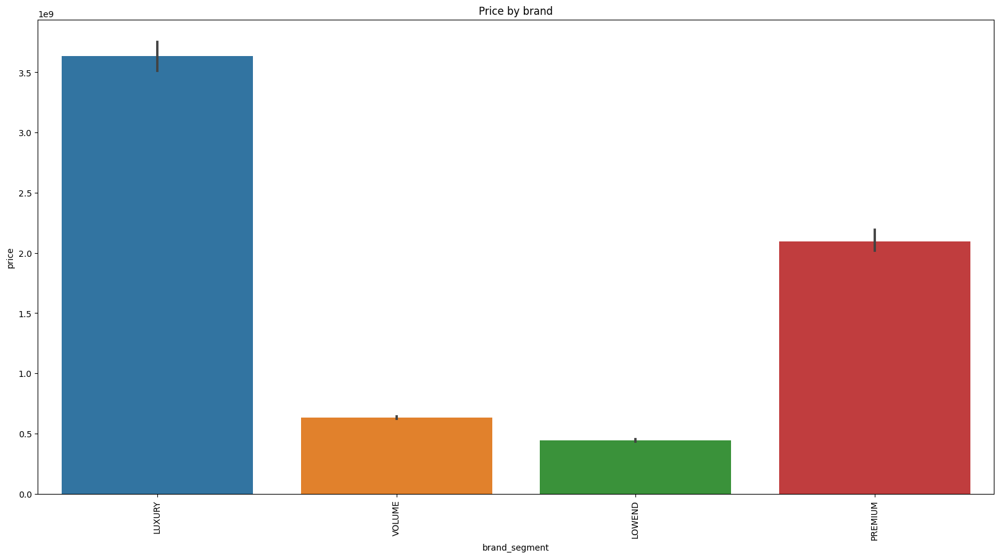

In [36]:
#vẽ price theo brand, series,year
plt.figure(figsize=(20, 10))
sns.barplot(x='brand_segment', y='price', data=df)
plt.title('Price by brand')
plt.xticks(rotation=90)
plt.show()

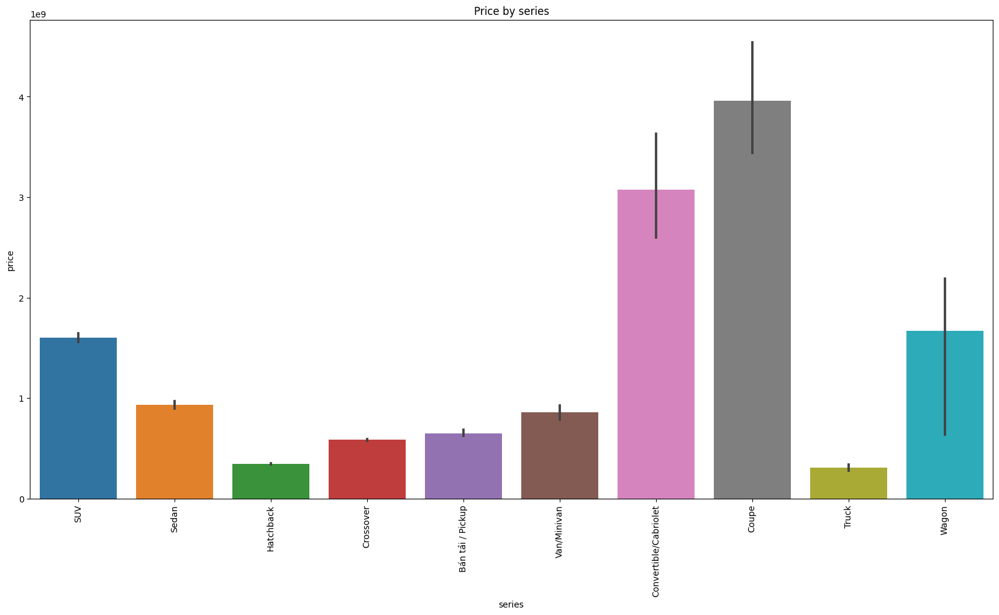

In [37]:
plt.figure(figsize=(20, 10))
sns.barplot(x='series', y='price', data=df)
plt.title('Price by series')
plt.xticks(rotation=90)
plt.show()

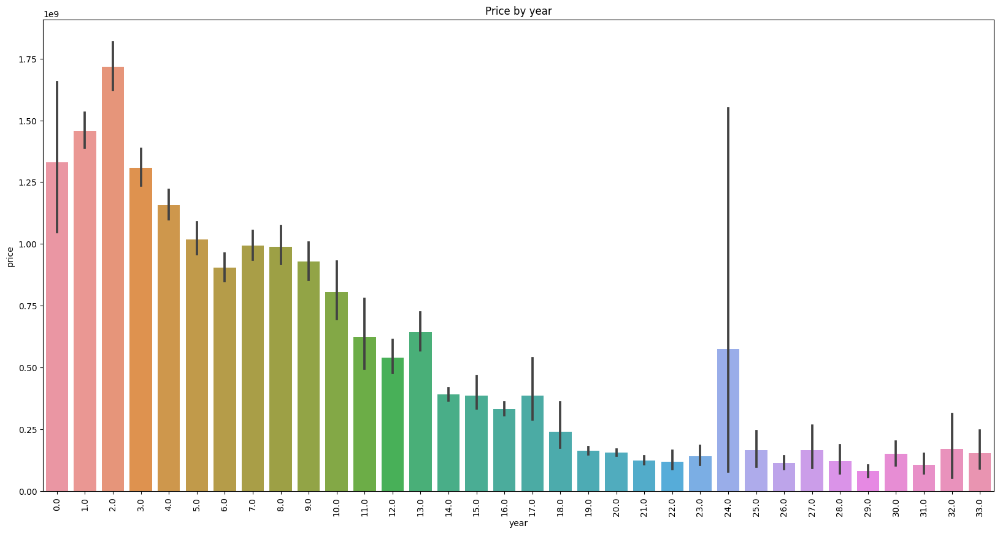

In [38]:
plt.figure(figsize=(20, 10))
#đổi năm sản xuất thành tuổi xe
df['year'] = 2023 - df['year']
sns.barplot(x='year', y='price', data=df)
plt.title('Price by year')
plt.xticks(rotation=90)
plt.show()

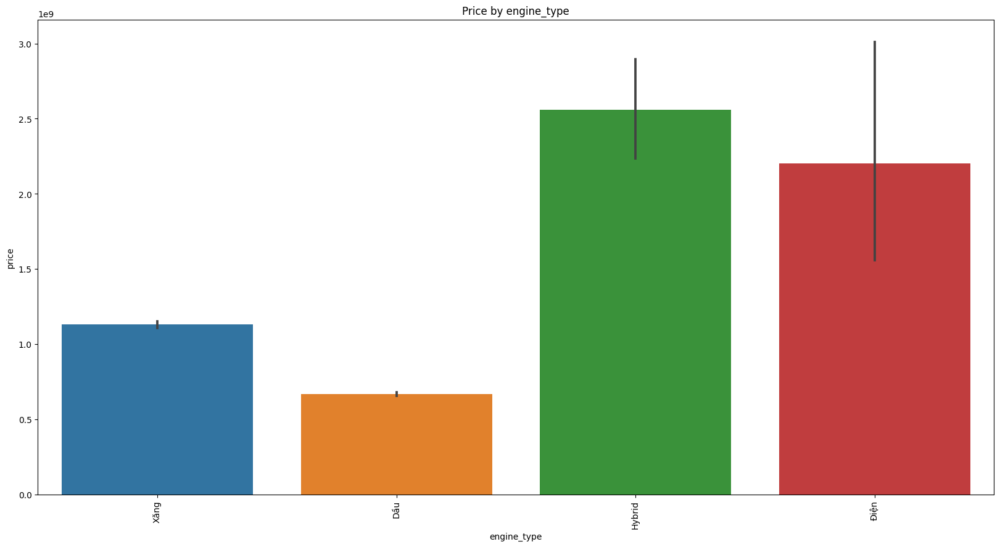

In [39]:
plt.figure(figsize=(20, 10))
sns.barplot(x='engine_type', y='price', data=df)
plt.title('Price by engine_type')
plt.xticks(rotation=90)
plt.show()


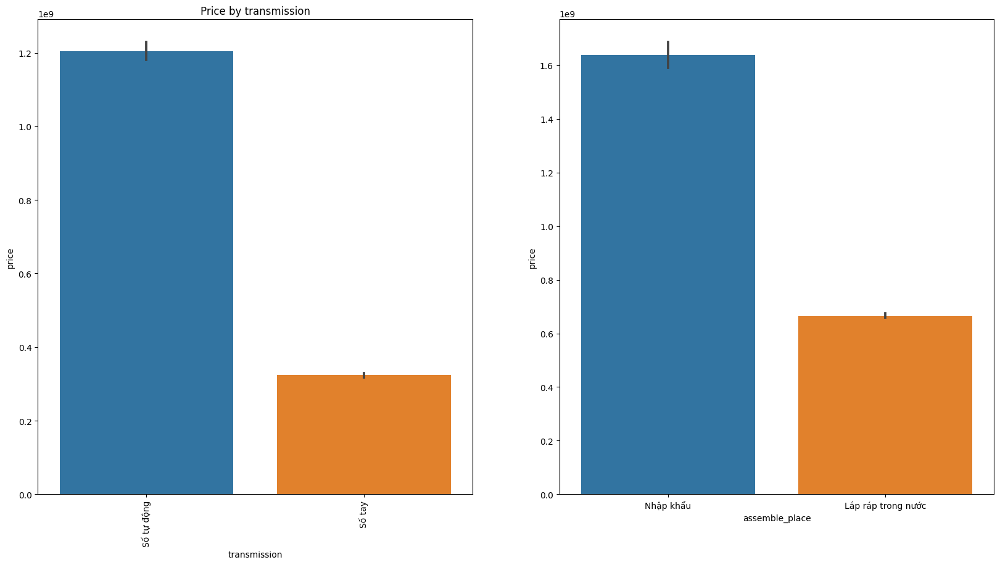

In [40]:
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
sns.barplot(x='transmission', y='price', data=df)
plt.title('Price by transmission')
plt.xticks(rotation=90)
plt.subplot(1, 2, 2)
sns.barplot(x='assemble_place', y='price', data=df)
plt.show()

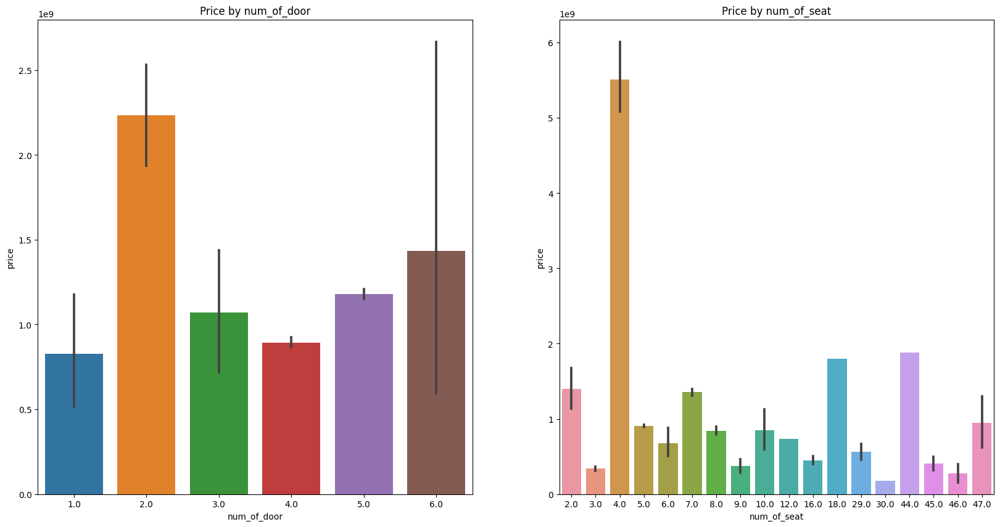

In [41]:
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
sns.barplot(x='num_of_door', y='price', data=df)
plt.title('Price by num_of_door')
plt.subplot(1, 2, 2)
sns.barplot(x='num_of_seat', y='price', data=df)
plt.title('Price by num_of_seat')
plt.show()

# Tìm hiểu về mối liên hệ giữa các thuộc tính với nhau

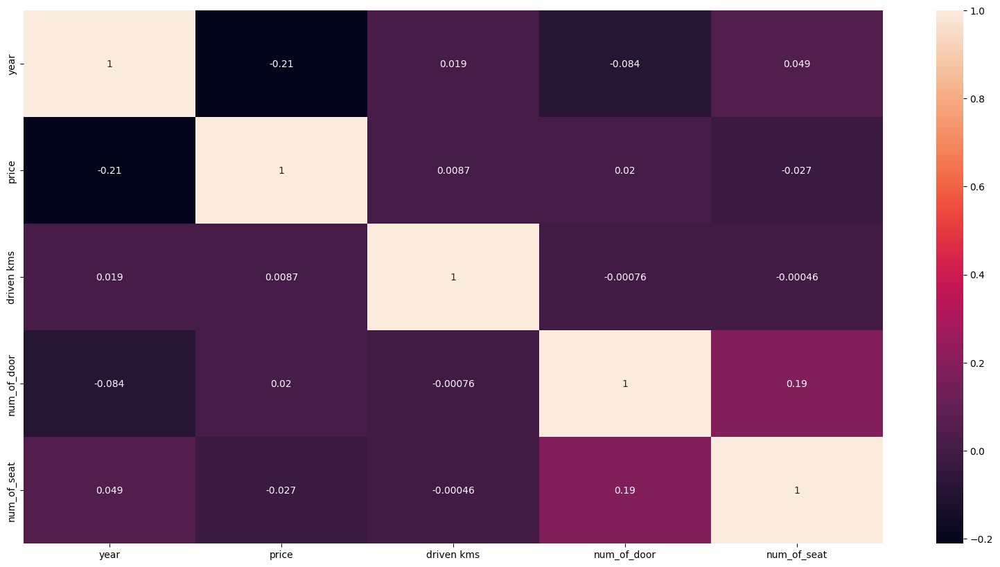

In [42]:
#vẽ biểu đồ nhiệt giữa price và các thuộc tính trừ model
plt.figure(figsize=(20, 10))
numeric_cols = df.select_dtypes(include=['float64', 'int64'])
sns.heatmap(numeric_cols.corr(), annot=True)
plt.show()



In [43]:
df


,car_name,year,price,assemble_place,series,driven kms,num_of_door,num_of_seat,engine_type,transmission,url,brand,brand_segment
0,LandRover Range Rover HSE 3.0,8.0,2.700000e+09,Nhập khẩu,SUV,65000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-landrover-range_rover-h...,LandRover,LUXURY
1,Mitsubishi Outlander 2.0 CVT Premium,5.0,6.660000e+08,Lắp ráp trong nước,SUV,50000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-mitsubishi-outlander-2....,Mitsubishi,VOLUME
2,Mazda 3 1.5L Luxury,4.0,4.900000e+08,Lắp ráp trong nước,Sedan,51000.0,4.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mazda-3-1.5l-luxury-201...,Mazda,VOLUME
3,Mazda 2 1.5 AT,8.0,3.650000e+08,Lắp ráp trong nước,Sedan,38000.0,4.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mazda-2-1.5-at-2015-491...,Mazda,VOLUME
4,Suzuki Swift GLX 1.2 AT,2.0,5.650000e+08,Nhập khẩu,Hatchback,6000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-suzuki-swift-glx-1.2-at...,Suzuki,LOWEND
...,...,...,...,...,...,...,...,...,...,...,...,...,...
26898,Suzuki Swift GLX 1.2 AT,2.0,5.150000e+08,Nhập khẩu,Hatchback,3000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-suzuki-swift-glx-1.2-at...,Suzuki,LOWEND
26899,Hyundai i10 Grand 1.2 AT,3.0,3.850000e+08,Lắp ráp trong nước,Hatchback,20000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-hyundai-i10-grand-1.2-a...,Hyundai,VOLUME
26900,Toyota Rush 1.5S AT,4.0,6.790000e+08,Nhập khẩu,SUV,60000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-toyota-rush-1.5s-at-201...,Toyota,VOLUME
26901,Lexus GX 460,13.0,1.500000e+09,Nhập khẩu,SUV,60000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-lexus-gx-460-2010-4557366,Lexus,LUXURY


# Mã hóa các cột dạng nhãn thành dạng số để có thể sử dụng cho mô hình học máy

Cột assemble_place chỉ có 2 giá trị là 'Lắp ráp trong nước' và 'Nhập khẩu', ta sẽ mã hóa thành 0 và 1

In [44]:
df['assemble_place'] = df['assemble_place'].map({'Lắp ráp trong nước': 0, 'Nhập khẩu': 1})

In [45]:
df['assemble_place'].value_counts()

assemble_place
0    14230
1    10264
Name: count, dtype: int64

Cột brand sẽ được mã hóa bằng phương pháp One-hot encoding

# Biểu đồ tiếp theo : 

In [46]:
df['brand'].value_counts()

brand
Toyota        4673
Hyundai       2775
Mercedes      2732
Kia           2628
Ford          2198
Mazda         1890
Mitsubishi    1003
Lexus          986
Honda          981
Other          725
VinFast        663
Chevrolet      560
BMW            492
LandRover      405
Porsche        394
Nissan         335
Suzuki         278
Audi           250
Peugeot        231
Daewoo         191
Volvo          104
Name: count, dtype: int64

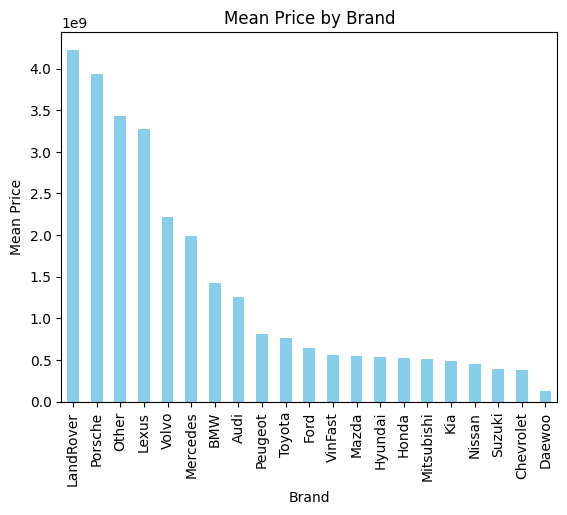

In [47]:
mean_price_by_brand = df.groupby('brand')['price'].mean()
mean_price_by_brand = mean_price_by_brand.sort_values(ascending=False)
# Plotting the bar chart
mean_price_by_brand.plot(kind='bar', color='skyblue')
plt.title('Mean Price by Brand')
plt.xlabel('Brand')
plt.ylabel('Mean Price')
plt.show()

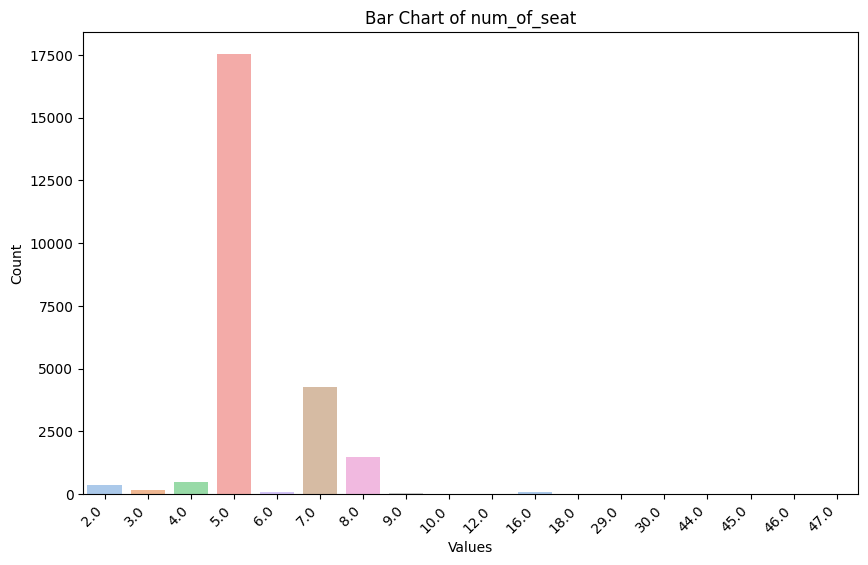

In [48]:
def plot_bar_chart(df, column_name):
    # Assuming you want to count the occurrences of each value in the column
    value_counts = df[column_name].value_counts()

    # Create a color palette with a different color for each unique value
    colors = sns.color_palette("pastel", len(value_counts))

    # Create a bar plot using Seaborn
    plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
    bar_plot = sns.barplot(x=value_counts.index, y=value_counts.values, palette=colors)

    # Add labels and title
    bar_plot.set(xlabel='Values', ylabel='Count', title=f'Bar Chart of {column_name}')

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')

    # Show the plot
    plt.show()
plot_bar_chart(df,'num_of_seat')

In [49]:
len(df[df['year'] <=  2]['car_name'].value_counts())


480

In [50]:
df

,car_name,year,price,assemble_place,series,driven kms,num_of_door,num_of_seat,engine_type,transmission,url,brand,brand_segment
0,LandRover Range Rover HSE 3.0,8.0,2.700000e+09,1,SUV,65000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-landrover-range_rover-h...,LandRover,LUXURY
1,Mitsubishi Outlander 2.0 CVT Premium,5.0,6.660000e+08,0,SUV,50000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-mitsubishi-outlander-2....,Mitsubishi,VOLUME
2,Mazda 3 1.5L Luxury,4.0,4.900000e+08,0,Sedan,51000.0,4.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mazda-3-1.5l-luxury-201...,Mazda,VOLUME
3,Mazda 2 1.5 AT,8.0,3.650000e+08,0,Sedan,38000.0,4.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mazda-2-1.5-at-2015-491...,Mazda,VOLUME
4,Suzuki Swift GLX 1.2 AT,2.0,5.650000e+08,1,Hatchback,6000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-suzuki-swift-glx-1.2-at...,Suzuki,LOWEND
...,...,...,...,...,...,...,...,...,...,...,...,...,...
26898,Suzuki Swift GLX 1.2 AT,2.0,5.150000e+08,1,Hatchback,3000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-suzuki-swift-glx-1.2-at...,Suzuki,LOWEND
26899,Hyundai i10 Grand 1.2 AT,3.0,3.850000e+08,0,Hatchback,20000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-hyundai-i10-grand-1.2-a...,Hyundai,VOLUME
26900,Toyota Rush 1.5S AT,4.0,6.790000e+08,1,SUV,60000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-toyota-rush-1.5s-at-201...,Toyota,VOLUME
26901,Lexus GX 460,13.0,1.500000e+09,1,SUV,60000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-lexus-gx-460-2010-4557366,Lexus,LUXURY


In [51]:
df['series'].value_counts()

series
Sedan                    8800
SUV                      8283
Hatchback                2479
Crossover                1962
Bán tải / Pickup       1698
Van/Minivan               833
Coupe                     170
Truck                     170
Convertible/Cabriolet      95
Wagon                       4
Name: count, dtype: int64

In [52]:
# !pip install git+https://github.com/skrub-data/skrub.git

In [53]:
df

,car_name,year,price,assemble_place,series,driven kms,num_of_door,num_of_seat,engine_type,transmission,url,brand,brand_segment
0,LandRover Range Rover HSE 3.0,8.0,2.700000e+09,1,SUV,65000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-landrover-range_rover-h...,LandRover,LUXURY
1,Mitsubishi Outlander 2.0 CVT Premium,5.0,6.660000e+08,0,SUV,50000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-mitsubishi-outlander-2....,Mitsubishi,VOLUME
2,Mazda 3 1.5L Luxury,4.0,4.900000e+08,0,Sedan,51000.0,4.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mazda-3-1.5l-luxury-201...,Mazda,VOLUME
3,Mazda 2 1.5 AT,8.0,3.650000e+08,0,Sedan,38000.0,4.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mazda-2-1.5-at-2015-491...,Mazda,VOLUME
4,Suzuki Swift GLX 1.2 AT,2.0,5.650000e+08,1,Hatchback,6000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-suzuki-swift-glx-1.2-at...,Suzuki,LOWEND
...,...,...,...,...,...,...,...,...,...,...,...,...,...
26898,Suzuki Swift GLX 1.2 AT,2.0,5.150000e+08,1,Hatchback,3000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-suzuki-swift-glx-1.2-at...,Suzuki,LOWEND
26899,Hyundai i10 Grand 1.2 AT,3.0,3.850000e+08,0,Hatchback,20000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-hyundai-i10-grand-1.2-a...,Hyundai,VOLUME
26900,Toyota Rush 1.5S AT,4.0,6.790000e+08,1,SUV,60000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-toyota-rush-1.5s-at-201...,Toyota,VOLUME
26901,Lexus GX 460,13.0,1.500000e+09,1,SUV,60000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-lexus-gx-460-2010-4557366,Lexus,LUXURY


In [54]:
# df.dropna(subset=['price'], inplace=True)
# df.reset_index(drop=True, inplace=True)

# X_without_car = df.drop(['price','url','car_name'], axis=1)
# X_with_car = df.drop(['price','url'], axis=1)
# y = df['price']


In [55]:
# from sklearn.ensemble import HistGradientBoostingRegressor
# from sklearn.pipeline import make_pipeline
# from skrub import TableVectorizer
# from sklearn.linear_model import LinearRegression
# from sklearn.linear_model import LinearRegression
# from sklearn.linear_model import Ridge
# from sklearn.linear_model import Lasso
# from sklearn.linear_model import ElasticNet
# from sklearn.tree import DecisionTreeRegressor
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.ensemble import GradientBoostingRegressor
# from sklearn.svm import SVR
# from sklearn.neighbors import KNeighborsRegressor
# from xgboost import XGBRegressor



In [56]:
# from skrub import (
#     SimilarityEncoder,
    
#     MinHashEncoder,
#     GapEncoder,
# )
# import joblib 
# from sklearn.model_selection import cross_validate
# from sklearn.compose import make_column_transformer
# from sklearn.preprocessing import OneHotEncoder
# from sklearn.model_selection import cross_val_score
# import copy 
# def multitest_not_car_name(X,y,model):
#     copy_X = copy.deepcopy(X)
#     copy_y = copy.deepcopy(y)
#     X_train, X_test, y_train, y_test = train_test_split(copy_X, copy_y, test_size=0.2, random_state=42)
#     one_hot = OneHotEncoder(handle_unknown="ignore", sparse=False)
# #     encoders = {
# #         "one-hot": one_hot,
# #         "similarity": SimilarityEncoder(),
# #     #     "target": TargetEncoder(handle_unknown="ignore"),
# #         "minhash": MinHashEncoder(n_components=30),
# #         "gap": GapEncoder(n_components=30),
# #     }




#     all_scores = dict()

# #     for name, method in encoders.items():
#     encoder = make_column_transformer(
#         (one_hot, ['series', 'engine_type', 'transmission', 'brand', 'brand_segment']),
#         ("passthrough", ['year', 'assemble_place', 'driven kms', 'num_of_door', 'num_of_seat']),
#         # Last but not least, our dirty column
# #             (method, ['car_name']),
#         remainder="drop",
#     )

#     pipeline = make_pipeline(encoder, model)
#     print(model)
#     pipeline.fit(X_train, y_train)
#     scoring = {
#         'r2': 'r2',
#         'neg_mean_squared_error': 'neg_mean_squared_error',
#         'neg_mean_absolute_error': 'neg_mean_absolute_error'
#     }

#     scores = cross_validate(pipeline, X_test, y_test, scoring=scoring)
#     print(pipeline.predict(X_test.iloc[10:11]))
#     print(y_test.iloc[10])
    

#     # Print all metrics
#     for metric, values in scores.items():
#         if 'time' not in metric:
#             print(f"{metric}:  mean: {np.mean(values):.3f}; std: {np.std(values):.3f}")

#     print("\n")
#     all_scores['one_hot'] = scores
# def multitest(X,y,model):
#     copy_X = copy.deepcopy(X)
#     copy_y = copy.deepcopy(y)
#     X_train, X_test, y_train, y_test = train_test_split(copy_X, copy_y, test_size=0.2, random_state=42)
#     one_hot = OneHotEncoder(handle_unknown="ignore", sparse=False)
#     encoders = {
#         "one-hot": one_hot,
#         "similarity": SimilarityEncoder(),
#     #     "target": TargetEncoder(handle_unknown="ignore"),
#         "minhash": MinHashEncoder(n_components=30),
#         "gap": GapEncoder(n_components=30),
#     }




#     all_scores = dict()

#     for name, method in encoders.items():
#         encoder = make_column_transformer(
#             (one_hot, ['series', 'engine_type', 'transmission', 'brand', 'brand_segment']),
#             ("passthrough", ['year', 'assemble_place', 'driven kms', 'num_of_door', 'num_of_seat']),
#             # Last but not least, our dirty column
#             (method, ['car_name']),
#             remainder="drop",
#         )
    
#         pipeline = make_pipeline(encoder, model)
#         print(model)
#         pipeline.fit(X_train, y_train)
#         scoring = {
#             'r2': 'r2',
#             'neg_mean_squared_error': 'neg_mean_squared_error',
#             'neg_mean_absolute_error': 'neg_mean_absolute_error'
#         }

#         scores = cross_validate(pipeline, X_test, y_test, scoring=scoring,cv =5)
#         print(pipeline.predict(X_test.iloc[10:11]))
#         print(y_test.iloc[10])
#         print(f"{name} encoding")

#         # Print all metrics
# #         for metric, values in scores.items():
# #             if 'absolute' in metric:
# #                 print(f"{metric}: mean: {np.mean(values) / np.sqrt(len(y_test)):.3f}; std: {np.std(values)/ np.sqrt(len(y_test)):.3f}")

# #             elif 'r2' in metric:
# #                 print(f"{metric}: mean: {np.mean(values):.3f}; std: {np.std(values):.3f}")
# #             elif 'squared' in metric: 
# #                 print(f"{metric}: mean: {np.mean(values) / (len(y_test) ** 2):.3f}; std: {np.std(values)/ (len(y_test) ** 2):.3f}")
# #         print("\n")
#         # Print all metrics
#         for metric, values in scores.items():
#             if 'time' not in metric:
#                 print(f"{metric}:  mean: {np.mean(values):.3f}; std: {np.std(values):.3f}")

#         print("\n")
#         all_scores[name] = scores
# multitest_not_car_name(X_without_car,y,XGBRegressor())
# multitest(X_with_car,y,XGBRegressor())

In [57]:
#     models = [
#         LinearRegression(),
#         Ridge(),
#         Lasso(),
#         ElasticNet(),
#         DecisionTreeRegressor(),
#         RandomForestRegressor(),
#         GradientBoostingRegressor(),
#         HistGradientBoostingRegressor(),
#         SVR(),
#         KNeighborsRegressor(),
#         XGBRegressor(),
#     ]

In [58]:
#  for model in models:
#         print(f"Testing model: {type(model).__name__}\n")
#         multitest_not_car_name(X_without_car,y,model)
#         multitest(X_with_car,y,model)

Cột engine_type sẽ được mã hóa bằng phương pháp One-hot encoding

In [59]:
df_car['brand'] = df_car['car_name'].str.split().str[0]


In [60]:
df['brand'].value_counts()

brand
Toyota        4673
Hyundai       2775
Mercedes      2732
Kia           2628
Ford          2198
Mazda         1890
Mitsubishi    1003
Lexus          986
Honda          981
Other          725
VinFast        663
Chevrolet      560
BMW            492
LandRover      405
Porsche        394
Nissan         335
Suzuki         278
Audi           250
Peugeot        231
Daewoo         191
Volvo          104
Name: count, dtype: int64

In [61]:
df_car[df_car["brand"] == "Toyota"]

,name,price,type,assemble_place,car_name,brand
5,Toyota Wigo G 1.2 AT - 2023,3.850000e+08,Xe mới 2023,Xe nhập khẩu,Toyota Wigo G 1.2 AT - 2023,Toyota
9,Toyota Land Cruiser 3.5 V6 - 2023,4.286000e+09,Xe mới 2023,Xe nhập khẩu,Toyota Land Cruiser 3.5 V6 - 2023,Toyota
52,Toyota Raize G 1.0 CVT - 2023,5.520000e+08,Xe mới 2023,Xe nhập khẩu,Toyota Raize G 1.0 CVT - 2023,Toyota
72,Toyota Corolla altis 1.8HEV - 2023,8.200000e+08,Xe mới 2023,Xe nhập khẩu,Toyota Corolla altis 1.8HEV - 2023,Toyota
73,Toyota Land Cruiser 3.5 V6 - 2023,4.286000e+09,Xe mới 2023,Xe nhập khẩu,Toyota Land Cruiser 3.5 V6 - 2023,Toyota
...,...,...,...,...,...,...
5718,Toyota Fortuner 2.4L 4x2 AT - 2023,1.075000e+09,Xe mới 2023,Xe lắp ráp trong nước,Toyota Fortuner 2.4L 4x2 AT - 2023,Toyota
5719,Toyota Avanza Premio 1.5 AT - 2023,5.620000e+08,Xe mới 2023,Xe lắp ráp trong nước,Toyota Avanza Premio 1.5 AT - 2023,Toyota
5722,Toyota Camry 2.5Q - 2023,1.355000e+09,Xe mới 2023,Xe nhập khẩu,Toyota Camry 2.5Q - 2023,Toyota
5724,Toyota Innova Cross 2.0AT - 2023,8.100000e+08,Xe mới 2023,Xe nhập khẩu,Toyota Innova Cross 2.0AT - 2023,Toyota


In [62]:
df['car_name'].value_counts()

car_name
Mazda 3 1.5 AT                       351
Mercedes Benz GLC 300 4Matic         333
Toyota Vios 1.5G                     318
Toyota Innova 2.0E                   296
Ford Ranger XLS 2.2L 4x2 AT          271
                                    ... 
Toyota Prado Vx                        1
Mercedes Benz E class E240 AT          1
Lexus RX 330                           1
Kia Sportage Signature 2.0G            1
Mercedes Benz S class S400 Hybrid      1
Name: count, Length: 1905, dtype: int64

In [63]:
df[df['car_name'] == 'Mazda 3 1.5 AT']['year'].value_counts()

year
5.0    153
6.0     87
7.0     81
8.0     29
9.0      1
Name: count, dtype: int64

In [64]:
# Loại bỏ tạm thời MG vì hãng này mới quá không thấy có hàng cũ 
df_car.drop(df_car[df_car['brand'] == 'MG'].index, inplace=True)


In [65]:
df_car["brand"].value_counts()

brand
Ford           1069
Toyota          670
Hyundai         665
Mitsubishi      435
Mercedes        342
Kia             290
Honda           276
Mazda           248
Lexus           221
BMW             215
Volkswagen      201
VinFast         192
Nissan          124
Subaru          121
Isuzu            96
Peugeot          79
Suzuki           58
Volvo            43
Audi             39
Jeep             30
Haval            25
Rolls            24
Skoda            22
LandRover        19
Mini             14
Teraco            5
Wuling            4
Lamborghini       4
GMC               3
RAM               2
Maserati          2
Hongqi            1
Bentley           1
Gaz               1
Hino              1
Thaco             1
JAC               1
Name: count, dtype: int64

In [66]:
df["brand"].value_counts()

brand
Toyota        4673
Hyundai       2775
Mercedes      2732
Kia           2628
Ford          2198
Mazda         1890
Mitsubishi    1003
Lexus          986
Honda          981
Other          725
VinFast        663
Chevrolet      560
BMW            492
LandRover      405
Porsche        394
Nissan         335
Suzuki         278
Audi           250
Peugeot        231
Daewoo         191
Volvo          104
Name: count, dtype: int64

In [67]:

# df_combined = pd.DataFrame(columns=['year', 'brand', 'price'])

# # Step 3: Set the 'year' column to 0 for df_car
# df_car['year'] = -1

# # Step 4: Concatenate df_car with df_combined
# df_combined = pd.concat([df_combined, df_car[['year', 'brand', 'price']]])

# # Step 5: Concatenate df with df_combined
# df_combined = pd.concat([df_combined])

# top_brands_2023_list = df_combined[df_combined['brand'] != 'Other']['brand'].value_counts().nlargest(10).index

# df_brands_2023 = df_combined[df_combined["brand"].isin(top_brands_2023_list)]

# # Assuming your DataFrame is named df

# # Step 1: Select the 10 most frequent brands excluding 'Other'
# top_brands = df[df['brand'] != 'Other']['brand'].value_counts().nlargest(10).index

# # Step 2: Filter the DataFrame for only those brands
# df_top_brands = df[(df['brand'].isin(top_brands)) & (df['brand'] != 'Other')]
# df_merged = pd.concat([df_top_brands, df_brands_2023], ignore_index=True, sort=False)
# # Step 3: Group by year and brand, calculate the mean price
# df_grouped = df_merged.groupby(['year', 'brand'])['price'].mean().reset_index()



# # Step 4: Pivot the table to have brands as columns
# df_pivot = df_grouped.pivot(index='year', columns='brand', values='price')

# # Step 5: Plot the data
# plt.figure(figsize=(12, 8))
# sns.lineplot(data=df_pivot, dashes=False)
# plt.title('Mean Price of Top 10 Car Brands Over the Years (Excluding Other)')
# plt.xlabel('Year')
# plt.ylabel('Mean Price')
# plt.show()

In [68]:

# mean_price_2023 = df_car.groupby('brand')['price'].mean()

# # Step 2: Create a new DataFrame with columns 'year', 'brand', and 'price'
# df_combined = pd.DataFrame(columns=['year', 'brand', 'price'])

# # Step 3: Set the 'year' column to 0 for df_car
# df_car['year'] = -1

# # Step 4: Concatenate df_car with df_combined
# df_combined = pd.concat([df_combined, df_car[['year', 'brand', 'price']]])

# # Step 5: Concatenate df with df_combined
# df_combined = pd.concat([df_combined])

# # Step 6: Group by year and brand, calculate the mean price
# df_grouped = df_combined.groupby(['year', 'brand'])['price'].mean().reset_index()

# # Step 7: Pivot the table to have brands as columns
# df_pivot = df_grouped.pivot(index='year', columns='brand', values='price')

# # Step 8: Subtract the mean price of new cars in 2023 from all values in the DataFrame
# df_pivot -= mean_price_2023

# df_combined


In [69]:
car_name_counts = df[df['car_name']=='2022']['car_name'].value_counts()

# Filter out car_names with counts larger than 100
car_name_counts_filtered = car_name_counts[car_name_counts >= 1]

# Print the results
print("Car Names with Counts Larger Than 100:")
print(car_name_counts_filtered)

Car Names with Counts Larger Than 100:
Series([], Name: count, dtype: int64)


In [70]:
df_car

,name,price,type,assemble_place,car_name,brand
0,Skoda Kodiaq Ambition 1.4 TSI Tur - 2023,1.169000e+09,Xe mới 2023,Xe nhập khẩu,Skoda Kodiaq Ambition 1.4 TSI Tur - 2023,Skoda
1,Mitsubishi Xpander 1.5 AT - 2023,5.340000e+08,Xe mới 2023,Xe nhập khẩu,Mitsubishi Xpander 1.5 AT - 2023,Mitsubishi
3,Volkswagen Teramont 2.0 AT - 2023,2.099000e+09,Xe mới 2023,Xe nhập khẩu,Volkswagen Teramont 2.0 AT - 2023,Volkswagen
4,Lexus LX 600 Vip - 2023,9.610000e+09,Xe mới 2023,Xe nhập khẩu,Lexus LX 600 Vip - 2023,Lexus
5,Toyota Wigo G 1.2 AT - 2023,3.850000e+08,Xe mới 2023,Xe nhập khẩu,Toyota Wigo G 1.2 AT - 2023,Toyota
...,...,...,...,...,...,...
5735,Hyundai SantaFe Tiêu chuẩn 2.2L - 2023,1.054000e+09,Xe mới 2023,Xe lắp ráp trong nước,Hyundai SantaFe Tiêu chuẩn 2.2L - 2023,Hyundai
5736,Hyundai SantaFe Cao cấp 2.5L HTRAC - 2023,1.132000e+09,Xe mới 2023,Xe lắp ráp trong nước,Hyundai SantaFe Cao cấp 2.5L HTRAC - 2023,Hyundai
5737,Hyundai SantaFe Tiêu chuẩn 2.5L - 2023,9.540000e+08,Xe mới 2023,Xe lắp ráp trong nước,Hyundai SantaFe Tiêu chuẩn 2.5L - 2023,Hyundai
5738,Hyundai Tucson 1.6 AT Turbo HTRAC Đặc biệt - ...,8.850000e+08,Xe mới 2023,Xe lắp ráp trong nước,Hyundai Tucson 1.6 AT Turbo HTRAC Đặc biệt - 2023,Hyundai


In [71]:
df_car['car_name'] = df_car['name'].apply(lambda x: x.split("-")[0].strip())
df_car['year'] = df_car['type'].apply(lambda x: x.split(" ")[3].strip())



In [72]:
df_car['year'].value_counts()
df_car = df_car[df_car['price'] != 0]
df_car['price'] = df_car['price'] * 1.1 + 20000000

/tmp/ipykernel_19/851696669.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_car['price'] = df_car['price'] * 1.1 + 20000000


In [73]:
df_car.drop(['name','type'],axis=1,inplace = True)

/tmp/ipykernel_19/3024977045.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_car.drop(['name','type'],axis=1,inplace = True)


In [74]:
df_car

,price,assemble_place,car_name,brand,year
0,1.305900e+09,Xe nhập khẩu,Skoda Kodiaq Ambition 1.4 TSI Tur,Skoda,2023
1,6.074000e+08,Xe nhập khẩu,Mitsubishi Xpander 1.5 AT,Mitsubishi,2023
3,2.328900e+09,Xe nhập khẩu,Volkswagen Teramont 2.0 AT,Volkswagen,2023
4,1.059100e+10,Xe nhập khẩu,Lexus LX 600 Vip,Lexus,2023
5,4.435000e+08,Xe nhập khẩu,Toyota Wigo G 1.2 AT,Toyota,2023
...,...,...,...,...,...
5735,1.179400e+09,Xe lắp ráp trong nước,Hyundai SantaFe Tiêu chuẩn 2.2L,Hyundai,2023
5736,1.265200e+09,Xe lắp ráp trong nước,Hyundai SantaFe Cao cấp 2.5L HTRAC,Hyundai,2023
5737,1.069400e+09,Xe lắp ráp trong nước,Hyundai SantaFe Tiêu chuẩn 2.5L,Hyundai,2023
5738,9.935000e+08,Xe lắp ráp trong nước,Hyundai Tucson 1.6 AT Turbo HTRAC Đặc biệt,Hyundai,2023


In [75]:
df_car['year'].value_counts()

year
2023    5098
2022     362
2021      38
2024      24
2020       6
2019       1
Name: count, dtype: int64

In [76]:

df_car['year'] = -1

/tmp/ipykernel_19/2788283996.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_car['year'] = -1


In [77]:
df_car

,price,assemble_place,car_name,brand,year
0,1.305900e+09,Xe nhập khẩu,Skoda Kodiaq Ambition 1.4 TSI Tur,Skoda,-1
1,6.074000e+08,Xe nhập khẩu,Mitsubishi Xpander 1.5 AT,Mitsubishi,-1
3,2.328900e+09,Xe nhập khẩu,Volkswagen Teramont 2.0 AT,Volkswagen,-1
4,1.059100e+10,Xe nhập khẩu,Lexus LX 600 Vip,Lexus,-1
5,4.435000e+08,Xe nhập khẩu,Toyota Wigo G 1.2 AT,Toyota,-1
...,...,...,...,...,...
5735,1.179400e+09,Xe lắp ráp trong nước,Hyundai SantaFe Tiêu chuẩn 2.2L,Hyundai,-1
5736,1.265200e+09,Xe lắp ráp trong nước,Hyundai SantaFe Cao cấp 2.5L HTRAC,Hyundai,-1
5737,1.069400e+09,Xe lắp ráp trong nước,Hyundai SantaFe Tiêu chuẩn 2.5L,Hyundai,-1
5738,9.935000e+08,Xe lắp ráp trong nước,Hyundai Tucson 1.6 AT Turbo HTRAC Đặc biệt,Hyundai,-1


In [78]:
top_brands_2023_list = df_car[df_car['brand'] != 'Other']['brand'].value_counts().nlargest(12).index

In [79]:
top_brands_2023_list

Index(['Ford', 'Toyota', 'Hyundai', 'Mitsubishi', 'Mercedes', 'Kia', 'Honda',
       'Mazda', 'Lexus', 'BMW', 'Volkswagen', 'VinFast'],
      dtype='object', name='brand')

In [80]:
top_brands_2023_list_old = df[df['brand'] != 'Other']['brand'].value_counts().nlargest(12).index

In [81]:
top_brands_2023_list_old

Index(['Toyota', 'Hyundai', 'Mercedes', 'Kia', 'Ford', 'Mazda', 'Mitsubishi',
       'Lexus', 'Honda', 'VinFast', 'Chevrolet', 'BMW'],
      dtype='object', name='brand')

In [82]:
len(top_brands_2023_list_old)

12

In [83]:
len(top_brands_2023_list)

12

In [84]:
for brand1 in top_brands_2023_list : 
    for brand2 in top_brands_2023_list_old:
        if brand1 == brand2: 
            print(brand1)

Ford
Toyota
Hyundai
Mitsubishi
Mercedes
Kia
Honda
Mazda
Lexus
BMW
VinFast


In [85]:
best_brands = ["Ford",
"Toyota",
"Hyundai",
"Mitsubishi",
"Mercedes",
"Kia",
"Honda",
"Mazda",
"Lexus",
'BMW',
'VinFast'
]

/tmp/ipykernel_19/2521891779.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_car['year'] = -1


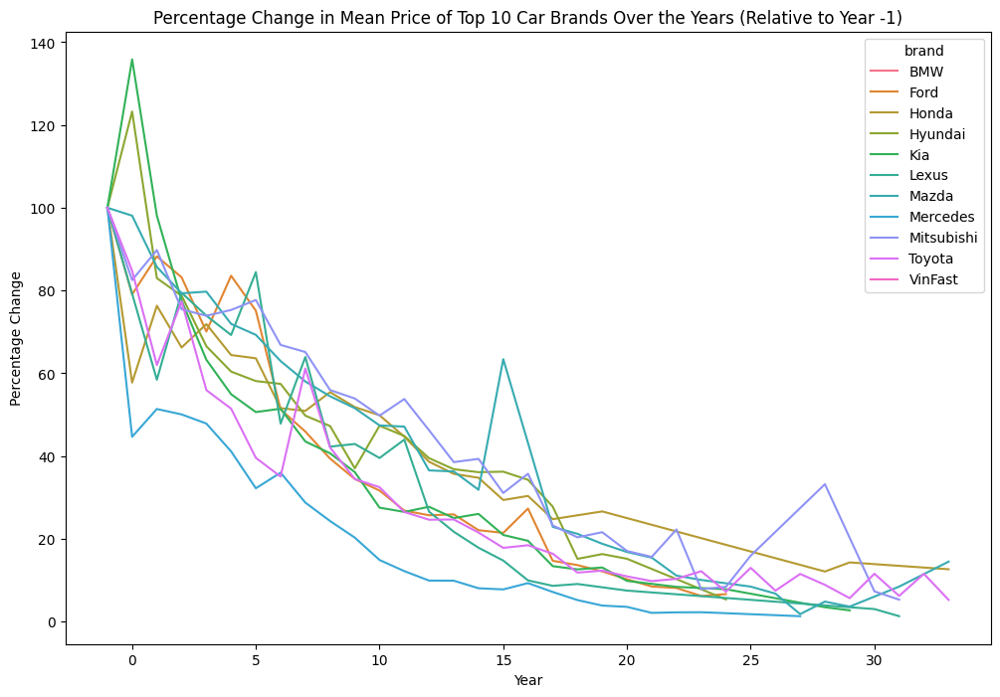

In [86]:

df_combined = pd.DataFrame(columns=['year', 'brand', 'price'])

# Step 3: Set the 'year' column to 0 for df_car
df_car['year'] = -1

# Step 4: Concatenate df_car with df_combined
df_combined = pd.concat([df_combined, df_car[['year', 'brand', 'price']]])

# Step 5: Concatenate df with df_combined
df_combined = pd.concat([df_combined])

top_brands_2023_list = df_combined[df_combined['brand'] != 'Other']['brand'].value_counts().nlargest(10).index

df_brands_2023 = df_combined[df_combined["brand"].isin(top_brands_2023_list)]

# Assuming your DataFrame is named df

# Step 1: Select the 10 most frequent brands excluding 'Other'
top_brands = df[df['brand'] != 'Other']['brand'].value_counts().nlargest(10).index

# Step 2: Filter the DataFrame for only those brands
df_top_brands = df[(df['brand'].isin(top_brands)) & (df['brand'] != 'Other')]
df_merged = pd.concat([df_top_brands, df_brands_2023], ignore_index=True, sort=False)
# # Step 3: Group by year and brand, calculate the mean price
# df_grouped = df_merged.groupby(['year', 'brand'])['price'].mean().reset_index()



# # Step 4: Pivot the table to have brands as columns
# df_pivot = df_grouped.pivot(index='year', columns='brand', values='price')

# # Step 5: Plot the data
# plt.figure(figsize=(12, 8))
# sns.lineplot(data=df_pivot, dashes=False)
# plt.title('Mean Price of Top 10 Car Brands Over the Years (Excluding Other)')
# plt.xlabel('Year')
# plt.ylabel('Mean Price')
# plt.show()


# Step 3: Group by year and brand, calculate the mean price
df_grouped = df_merged.groupby(['year', 'brand'])['price'].mean().reset_index()

# Step 4: Pivot the table to have brands as columns
df_pivot = df_grouped.pivot(index='year', columns='brand', values='price')

# Step 5: Calculate the percentage change relative to the initial year
df_percentage_change = df_pivot / df_pivot.loc[-1] * 100

# Step 6: Plot the data
plt.figure(figsize=(12, 8))
sns.lineplot(data=df_percentage_change, dashes=False)
plt.title('Percentage Change in Mean Price of Top 10 Car Brands Over the Years (Relative to Year -1)')
plt.xlabel('Year')
plt.ylabel('Percentage Change')
plt.show()

In [87]:
df_car

,price,assemble_place,car_name,brand,year
0,1.305900e+09,Xe nhập khẩu,Skoda Kodiaq Ambition 1.4 TSI Tur,Skoda,-1
1,6.074000e+08,Xe nhập khẩu,Mitsubishi Xpander 1.5 AT,Mitsubishi,-1
3,2.328900e+09,Xe nhập khẩu,Volkswagen Teramont 2.0 AT,Volkswagen,-1
4,1.059100e+10,Xe nhập khẩu,Lexus LX 600 Vip,Lexus,-1
5,4.435000e+08,Xe nhập khẩu,Toyota Wigo G 1.2 AT,Toyota,-1
...,...,...,...,...,...
5735,1.179400e+09,Xe lắp ráp trong nước,Hyundai SantaFe Tiêu chuẩn 2.2L,Hyundai,-1
5736,1.265200e+09,Xe lắp ráp trong nước,Hyundai SantaFe Cao cấp 2.5L HTRAC,Hyundai,-1
5737,1.069400e+09,Xe lắp ráp trong nước,Hyundai SantaFe Tiêu chuẩn 2.5L,Hyundai,-1
5738,9.935000e+08,Xe lắp ráp trong nước,Hyundai Tucson 1.6 AT Turbo HTRAC Đặc biệt,Hyundai,-1


In [88]:
unique_car_names_df_car = df_car['car_name'].unique()
print(len(unique_car_names_df_car))
# Filter df to include only rows where 'car_name' is in unique_car_names_df_car
matching_rows_df = df[df['car_name'].isin(unique_car_names_df_car)]

# Count the number of unique car names in df among those that appear in df_car
num_unique_car_names_in_df = matching_rows_df['car_name'].nunique()

# Print the result
print(f"Number of unique car names in df appearing in df_car: {num_unique_car_names_in_df}")


564
Number of unique car names in df appearing in df_car: 268


In [89]:
unique_car_names_df_car = df_car['car_name'].unique()

# Filter df to include only rows where 'car_name' is in unique_car_names_df_car
matching_rows_df = df[df['car_name'].isin(unique_car_names_df_car)]

# Filter df_car to include only rows where 'car_name' is in df
matching_rows_df_car = df_car[df_car['car_name'].isin(df['car_name'])]

# Concatenate the two parts
result_df = pd.concat([matching_rows_df, matching_rows_df_car])

# Print the result
result_df['car_name'].value_counts()

car_name
Mercedes Benz GLC 300 4Matic            373
Toyota Camry 2.5Q                       279
Mitsubishi Xpander 1.5 AT               255
Ford Ranger Wildtrak 2.0L 4x4 AT        254
Mazda 3 1.5L Luxury                     235
                                       ... 
Toyota Fortuner 2.4L 4x2 MT               2
Toyota Innova                             2
Kia Sportage Signature 2.0G               2
RAM 1500 Laramie 5.7L 4x4 AT              2
Mercedes Benz A class A35 AMG 4Matic      2
Name: count, Length: 268, dtype: int64

In [90]:
# baseline_prices = result_df[result_df['year'] == -1].groupby('car_name')['price'].mean()

# # Merge the baseline prices back to the original DataFrame
# result_df = pd.merge(result_df, baseline_prices, left_on='car_name', right_index=True, suffixes=('', '_baseline'))

# # Calculate the percentage change relative to the initial year
# result_df['price_change_percentage'] = (result_df['price'] / result_df['price_baseline'] - 1) * 100

# # Create a separate plot for each unique car_name
# unique_car_names = ['Mercedes Benz GLC 300 4Matic ']

# for car_name in unique_car_names:
#     car_data = result_df[result_df['car_name'] == car_name]
    
#     plt.plot(car_data['year'], car_data['price_change_percentage'], label=car_name)

# plt.xlabel('Year')
# plt.ylabel('Price Change Percentage Relative to Initial Year')
# plt.title('Percentage Change in Price Over Years')
# plt.legend()
# plt.show()

In [91]:
car_name_filter = 'Mercedes Benz GLC 300 4Matic'
filtered_df = result_df[result_df['car_name'] == car_name_filter]

# Calculate the mean price for the specified car_name with year == -1
baseline_price = filtered_df[filtered_df['year'] == -1]['price'].mean()

# Calculate the percentage change relative to the initial year
filtered_df['price_change_percentage'] = (filtered_df['price'] / baseline_price - 1) * 100

# # Create the plot
# plt.plot(filtered_df['year'], filtered_df['price_change_percentage'], label=car_name_filter)

# plt.xlabel('Year')
# plt.ylabel('Price Change Percentage Relative to Initial Year')
# plt.title(f'Percentage Change in Price for {car_name_filter} Over Years')
# plt.legend()
# plt.show()
filtered_df

/tmp/ipykernel_19/1011410070.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['price_change_percentage'] = (filtered_df['price'] / baseline_price - 1) * 100


,car_name,year,price,assemble_place,series,driven kms,num_of_door,num_of_seat,engine_type,transmission,url,brand,brand_segment,price_change_percentage
101,Mercedes Benz GLC 300 4Matic,3.0,1.699000e+09,0,SUV,40000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mercedes_benz-glc-300-4...,Mercedes,PREMIUM,-42.743332
135,Mercedes Benz GLC 300 4Matic,2.0,1.899000e+09,0,SUV,29000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mercedes_benz-glc-300-4...,Mercedes,PREMIUM,-36.003289
230,Mercedes Benz GLC 300 4Matic,1.0,1.898000e+09,0,SUV,19000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mercedes_benz-glc-300-4...,Mercedes,PREMIUM,-36.036989
313,Mercedes Benz GLC 300 4Matic,1.0,2.369000e+09,0,SUV,1938.0,4.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mercedes_benz-glc-300-4...,Mercedes,PREMIUM,-20.164187
324,Mercedes Benz GLC 300 4Matic,2.0,1.898000e+09,0,SUV,26000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-mercedes_benz-glc-300-4...,Mercedes,PREMIUM,-36.036989
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4684,Mercedes Benz GLC 300 4Matic,-1.0,2.966900e+09,Xe lắp ráp trong nước,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mercedes,NaN,-0.014828
4780,Mercedes Benz GLC 300 4Matic,-1.0,3.098900e+09,Xe lắp ráp trong nước,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mercedes,NaN,4.433600
4951,Mercedes Benz GLC 300 4Matic,-1.0,3.098900e+09,Xe lắp ráp trong nước,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mercedes,NaN,4.433600
4980,Mercedes Benz GLC 300 4Matic,-1.0,2.922900e+09,Xe lắp ráp trong nước,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mercedes,NaN,-1.497638


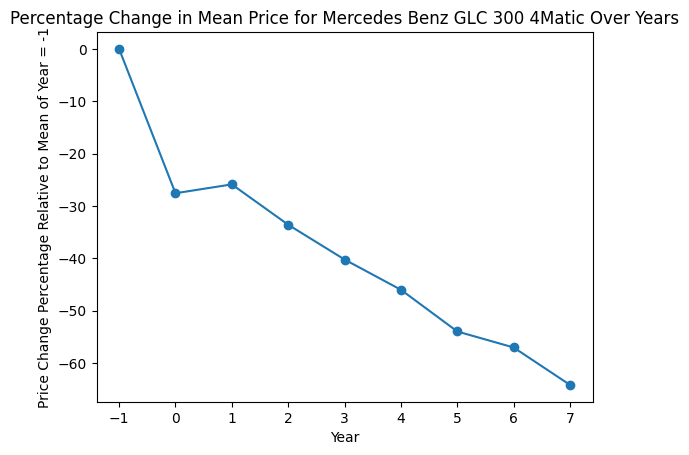

In [92]:
car_name_filter = 'Mercedes Benz GLC 300 4Matic'

# Filter the DataFrame for the specific car_name
filtered_df = result_df[result_df['car_name'] == car_name_filter]

# Calculate the mean price for each year
mean_prices = filtered_df.groupby('year')['price'].mean()

# Calculate the percentage change relative to the mean of year == -1
mean_prices_relative = (mean_prices / mean_prices.iloc[0] - 1) * 100

# Create the plot
plt.plot(mean_prices_relative.index, mean_prices_relative, marker='o', linestyle='-')

plt.xlabel('Year')
plt.ylabel('Price Change Percentage Relative to Mean of Year = -1')
plt.title(f'Percentage Change in Mean Price for {car_name_filter} Over Years')
plt.show()

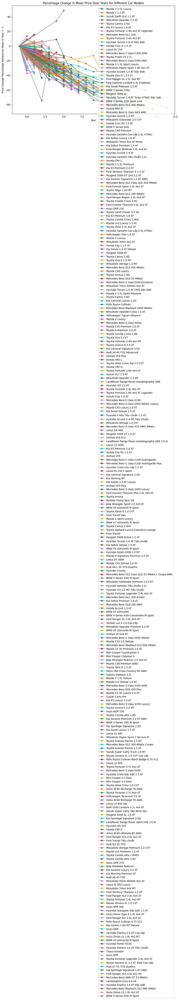

In [93]:
# Get all unique car names
unique_car_names = result_df['car_name'].unique()

plt.figure(figsize=(12, 8))

for car_name_filter in unique_car_names:
    # Filter the DataFrame for the specific car_name
    filtered_df = result_df[result_df['car_name'] == car_name_filter]

    # Calculate the mean price for each year
    mean_prices = filtered_df.groupby('year')['price'].mean()

    # Calculate the percentage change relative to the mean of year == -1
    mean_prices_relative = (mean_prices / mean_prices.iloc[0] - 1) * 100

    # Create the plot
    plt.plot(mean_prices_relative.index, mean_prices_relative, marker='o', linestyle='-', label=car_name_filter)

plt.xlabel('Year')
plt.ylabel('Price Change Percentage Relative to Mean of Year = -1')
plt.title('Percentage Change in Mean Price Over Years for Different Car Models')
plt.legend()
plt.show()

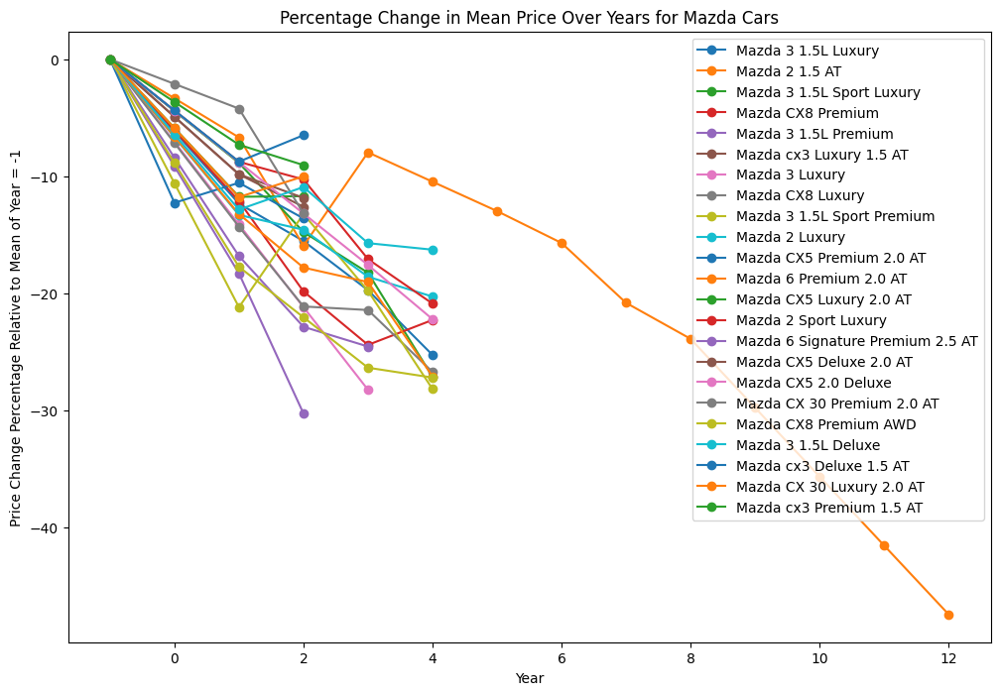

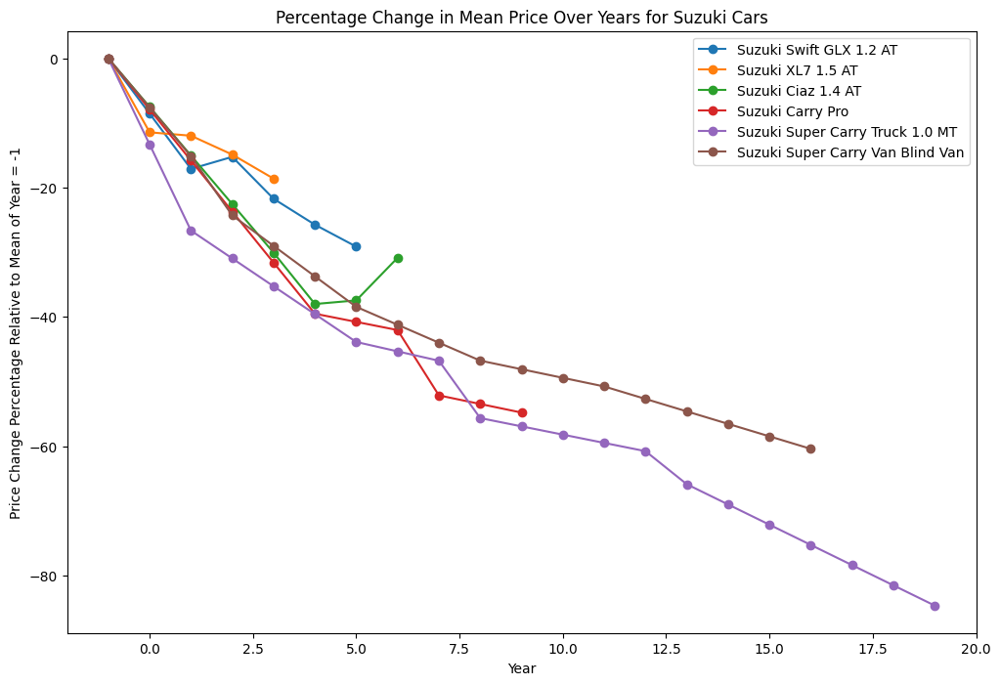

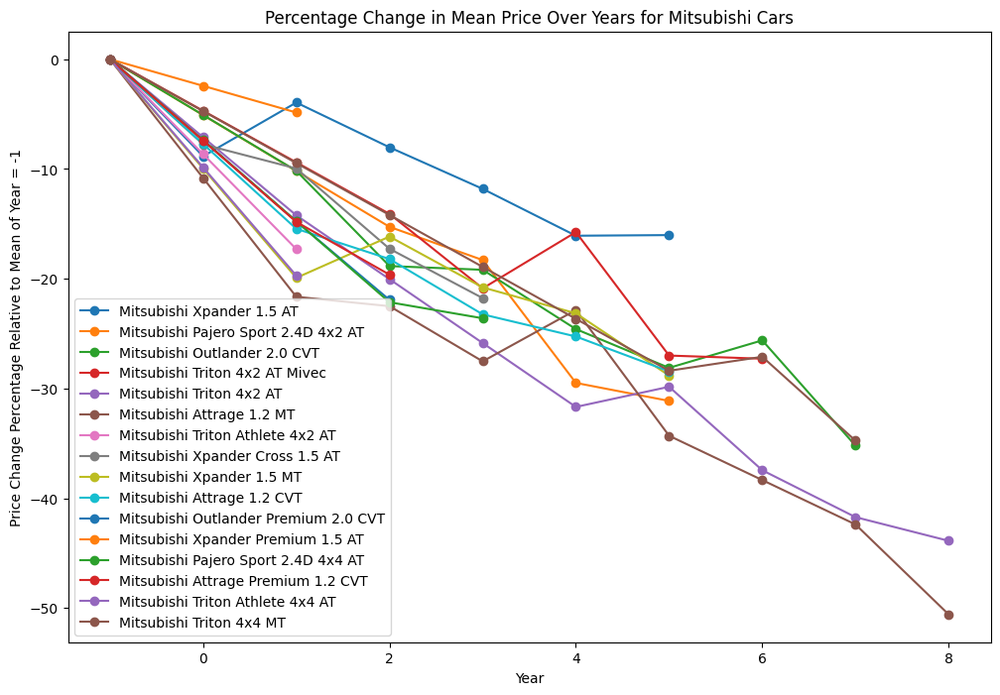

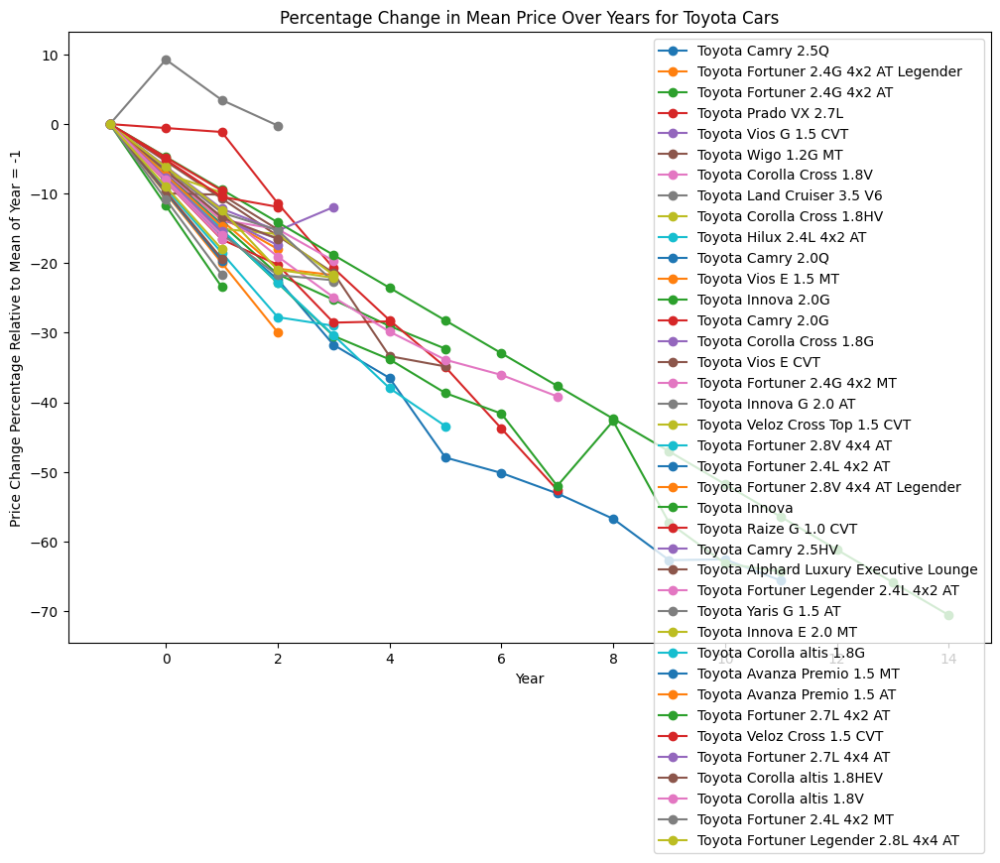

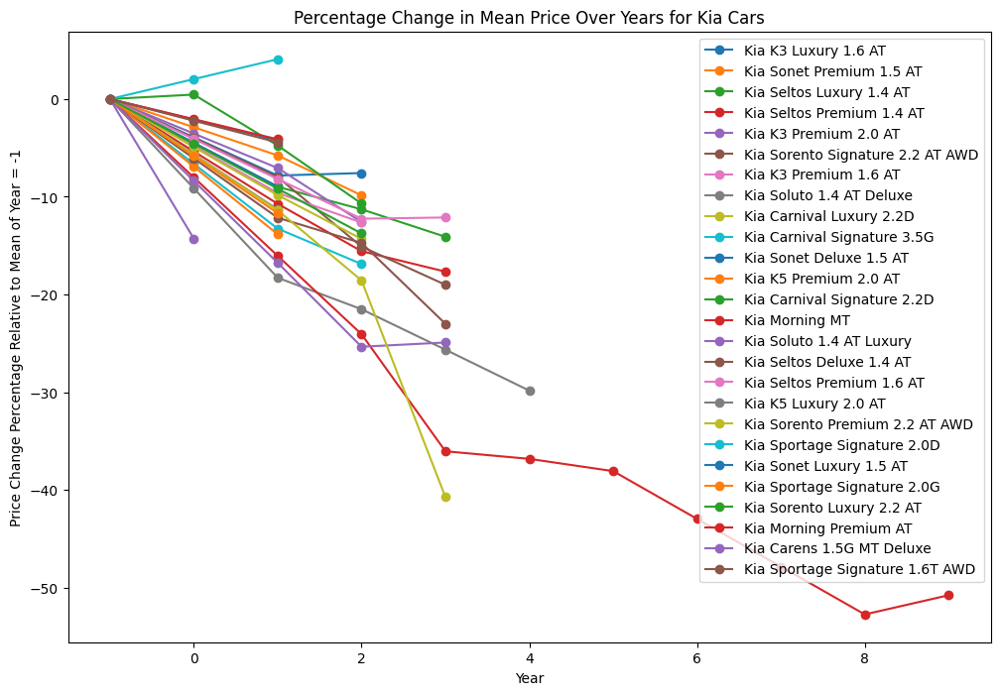

...

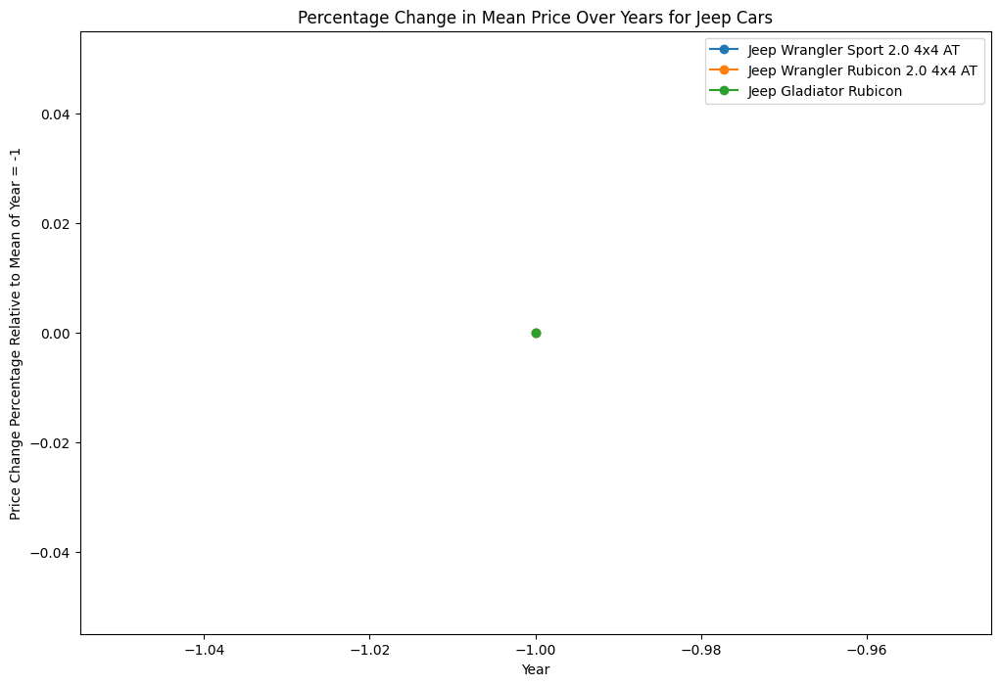

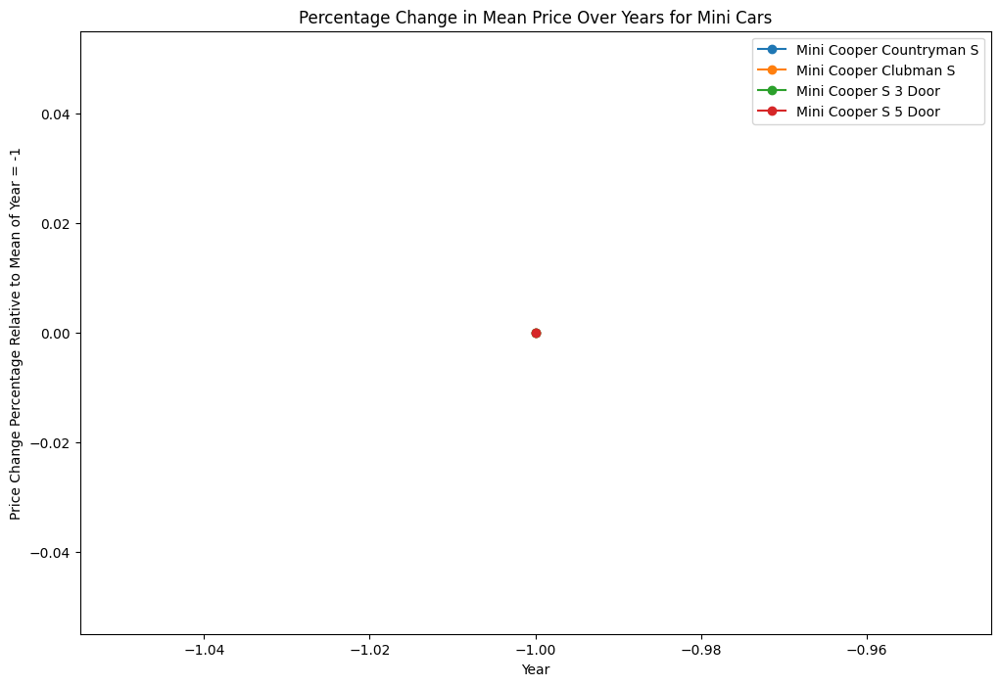

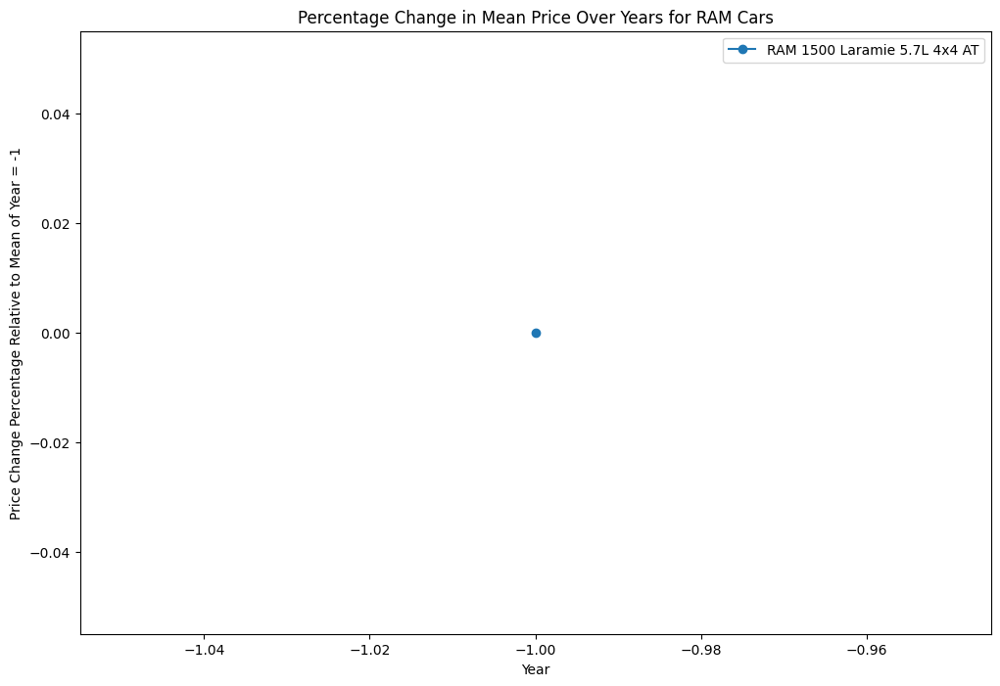

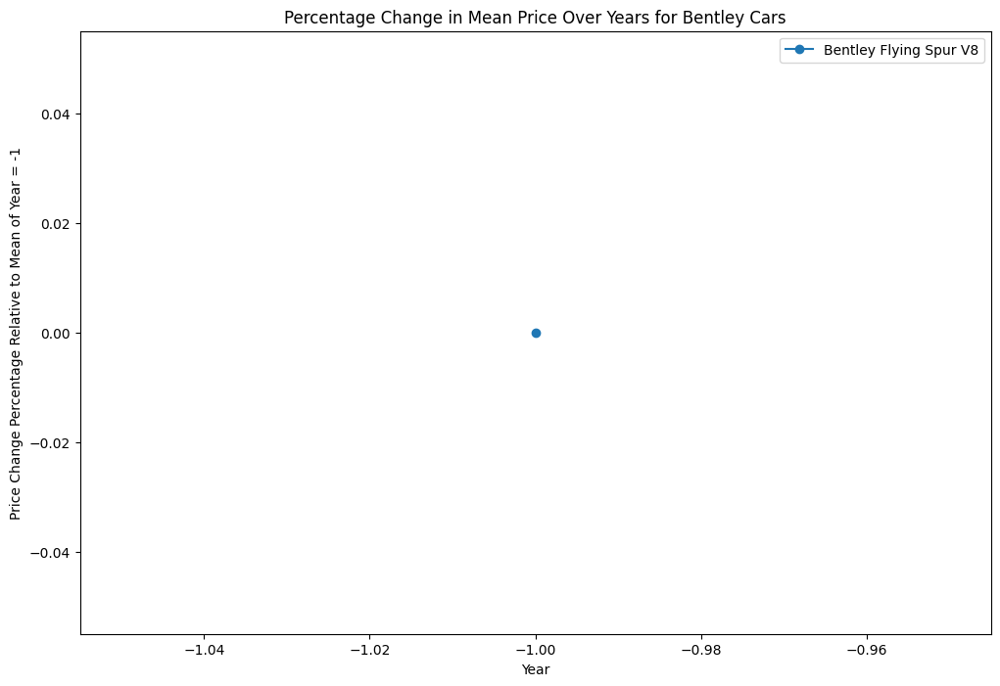

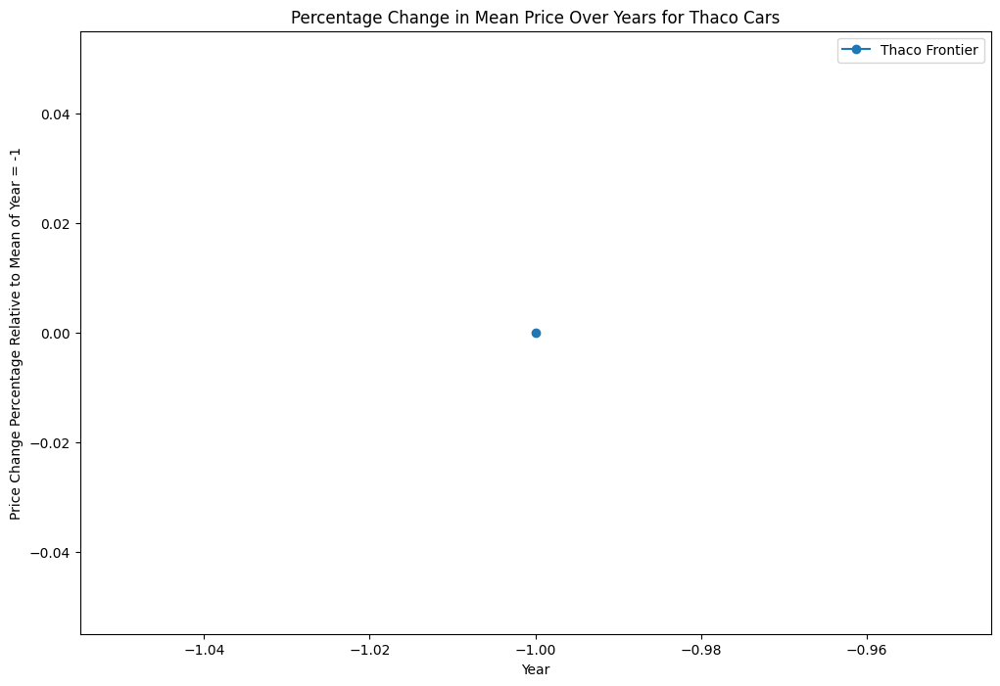

In [94]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'result_df' is your DataFrame
# Convert 'year' column to integer (if not already)
result_df['year'] = result_df['year'].astype(int)

# Get all unique car names and brands
unique_car_names = result_df['car_name'].unique()
unique_brands = result_df['brand'].unique()

for brand_filter in unique_brands:
    plt.figure(figsize=(12, 8))
    plt.title(f'Percentage Change in Mean Price Over Years for {brand_filter} Cars')
    plt.xlabel('Year')
    plt.ylabel('Price Change Percentage Relative to Mean of Year = -1')

    for car_name_filter in unique_car_names:
        # Filter the DataFrame for the specific car_name and brand
        filtered_df = result_df[(result_df['car_name'] == car_name_filter) & (result_df['brand'] == brand_filter)]

        # Calculate the mean price for each year
        mean_prices = filtered_df.groupby('year')['price'].mean()

        # Check if mean_prices is not empty
        if not mean_prices.empty:
            # Interpolate missing values
            mean_prices = mean_prices.reindex(range(mean_prices.index.min(), mean_prices.index.max() + 1))
            mean_prices = mean_prices.interpolate(method='linear')

            # Calculate the percentage change relative to the mean of year == -1
            mean_prices_relative = (mean_prices / mean_prices.iloc[0] - 1) * 100

            # Create the plot
            label = f'{car_name_filter}'
            plt.plot(mean_prices_relative.index, mean_prices_relative, marker='o', linestyle='-', label=label)

    plt.legend()
    plt.show()


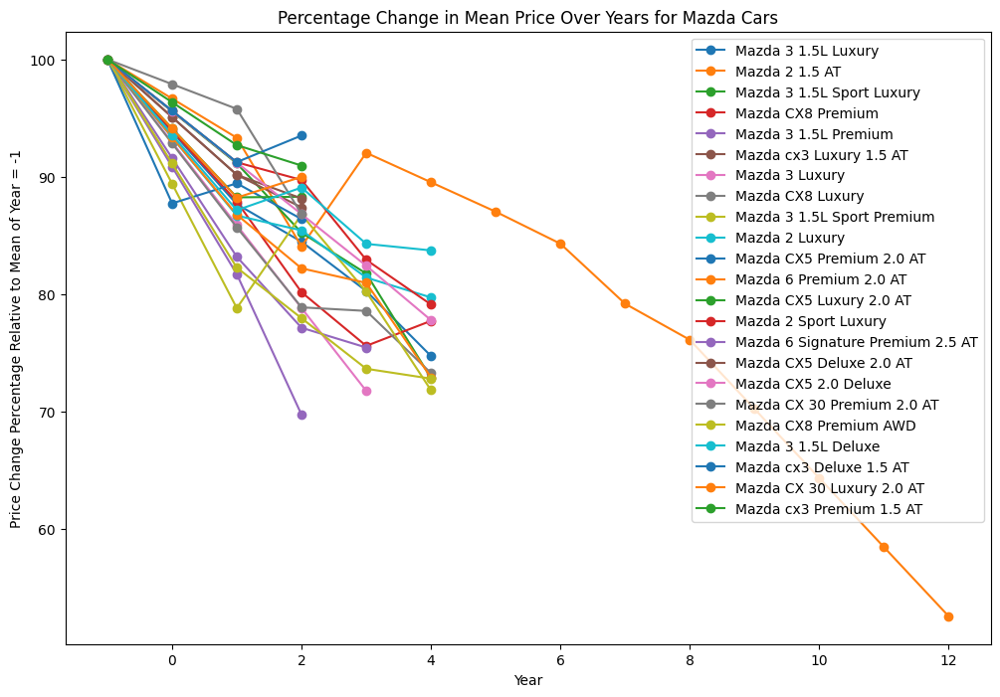

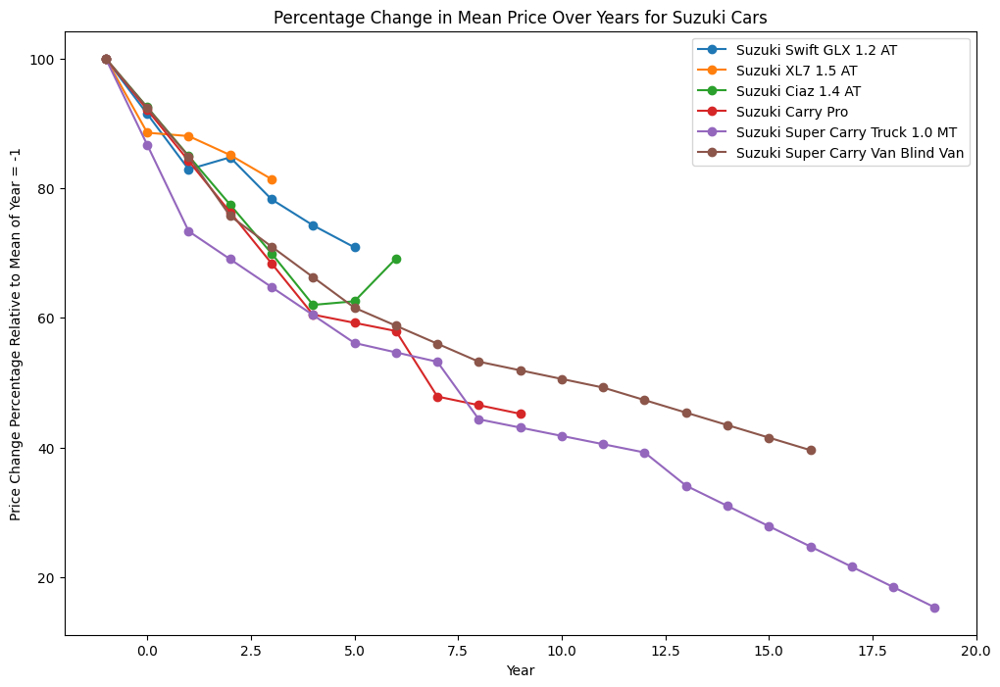

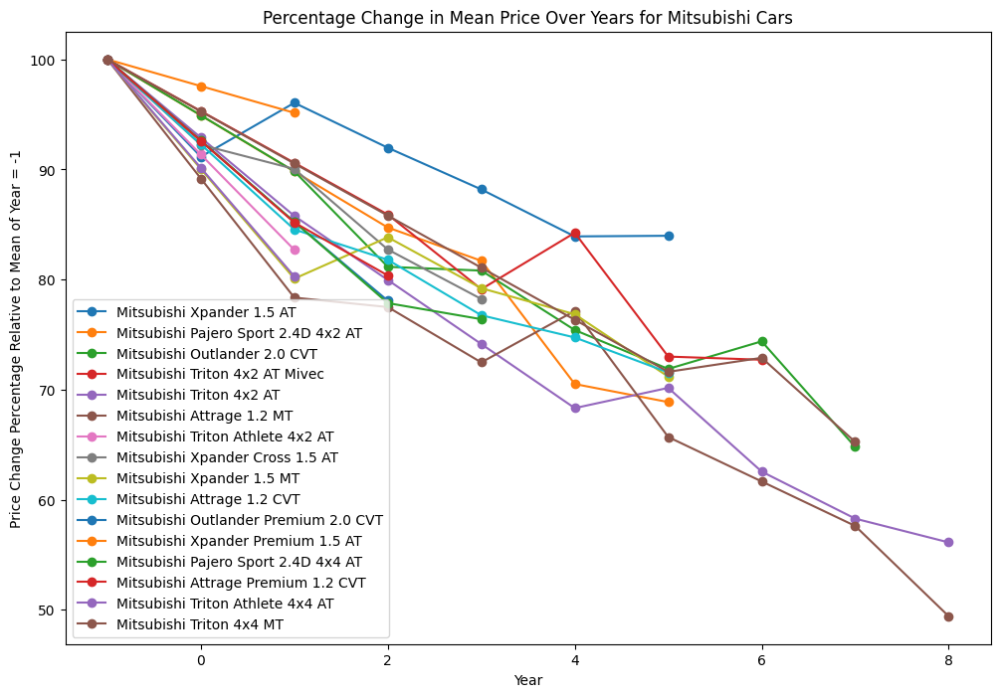

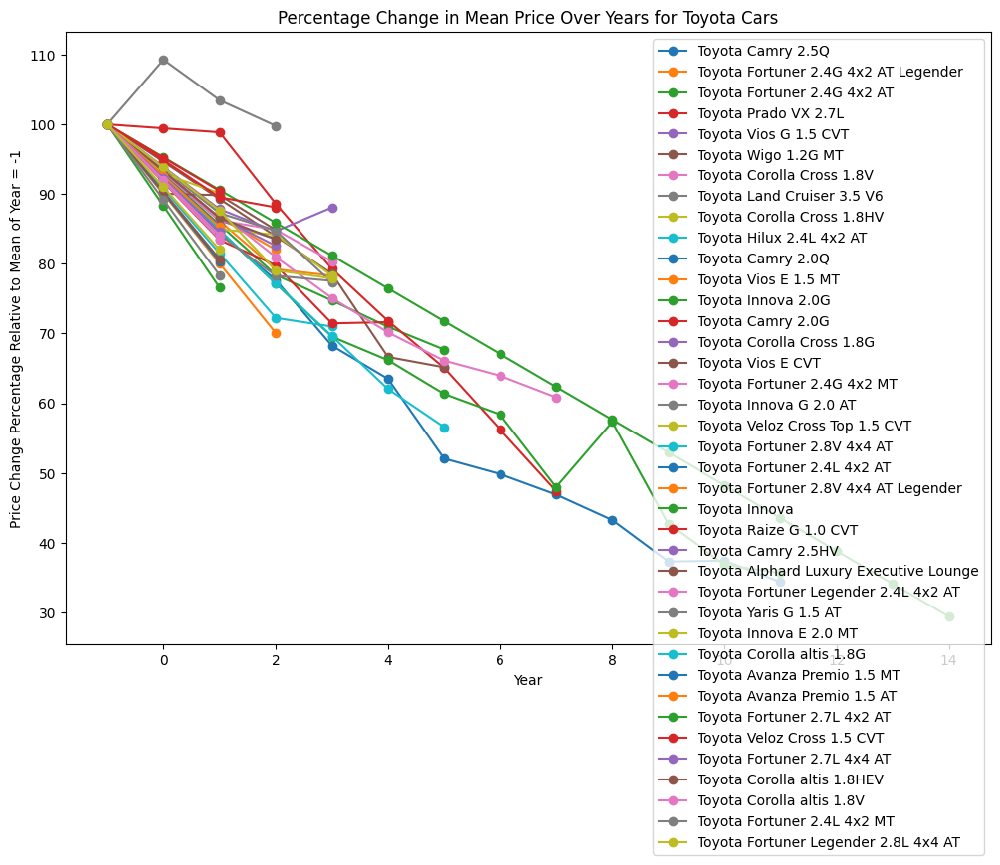

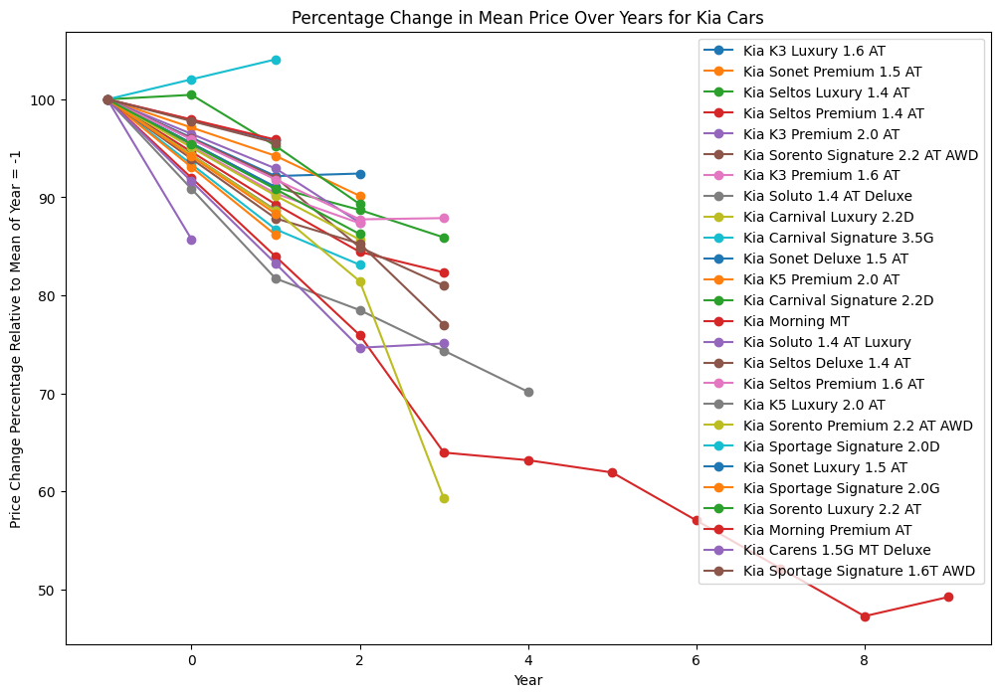

...

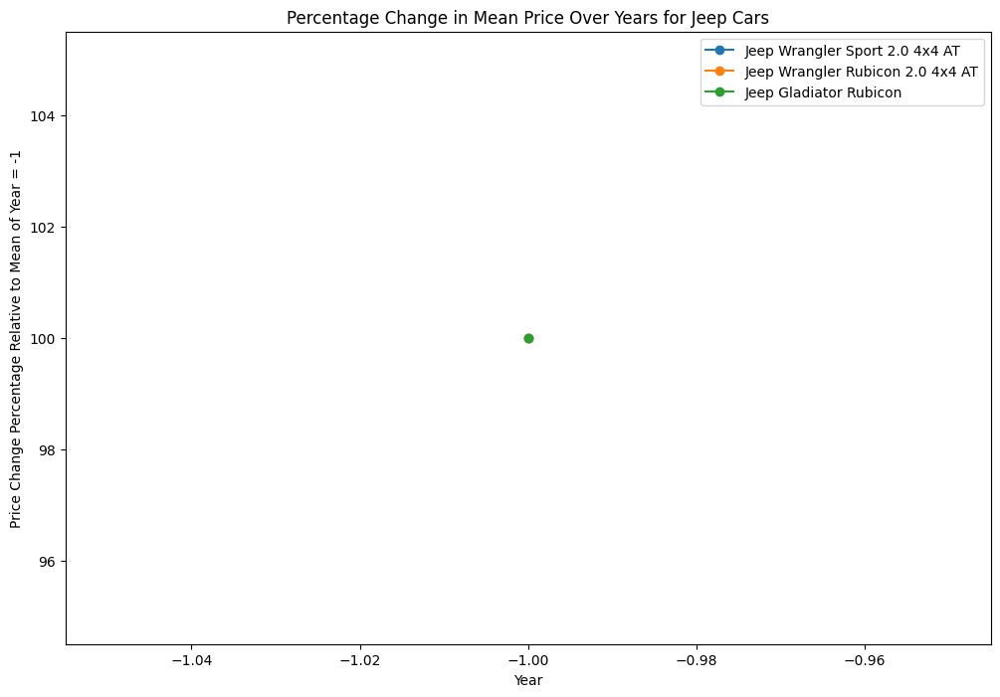

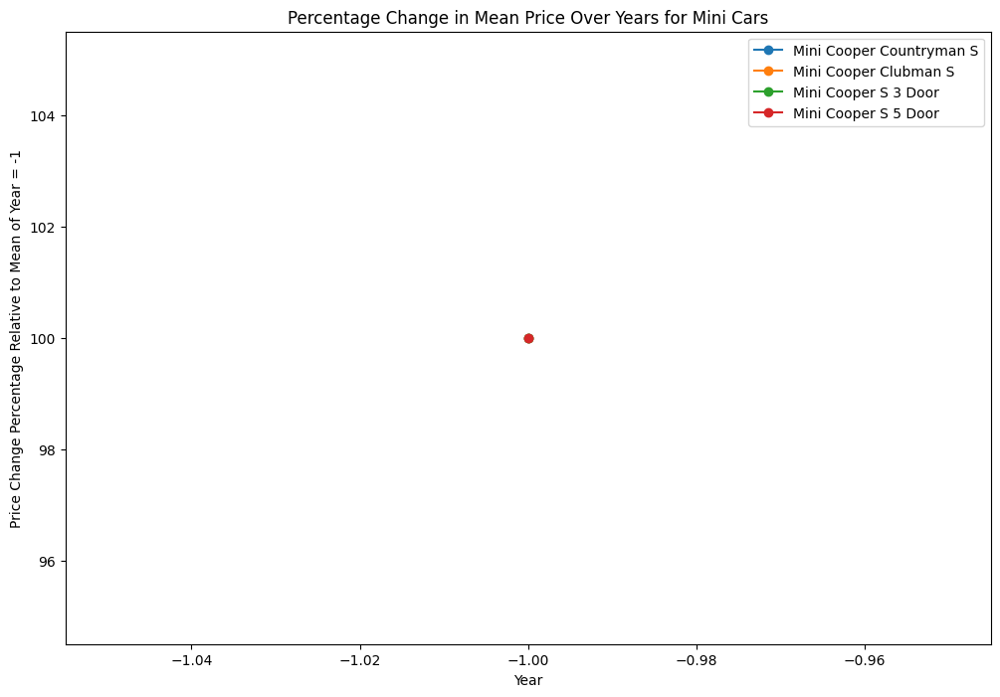

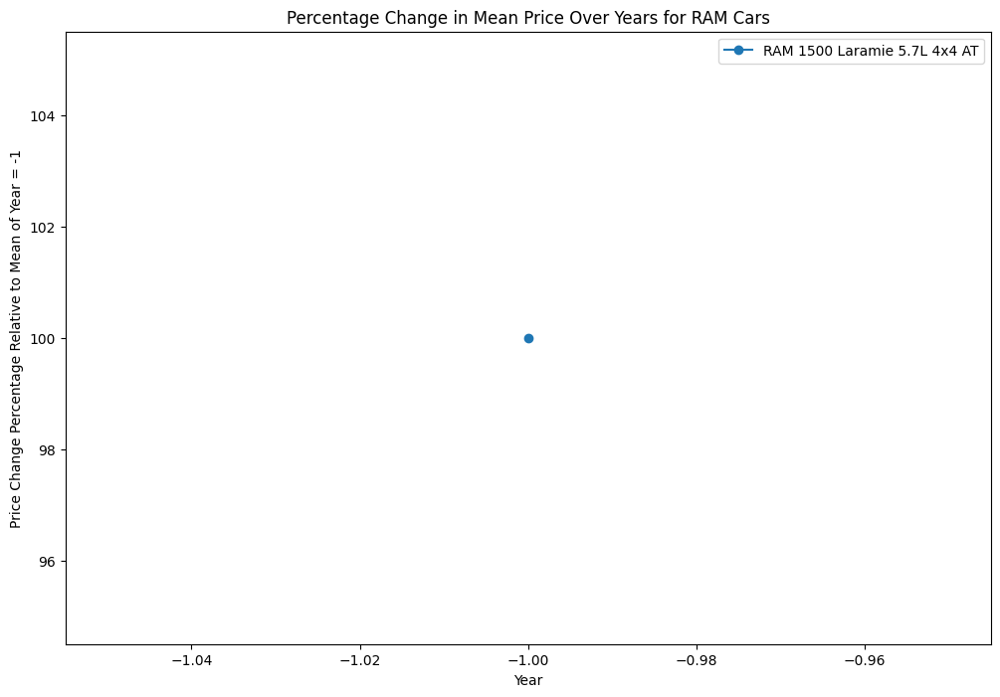

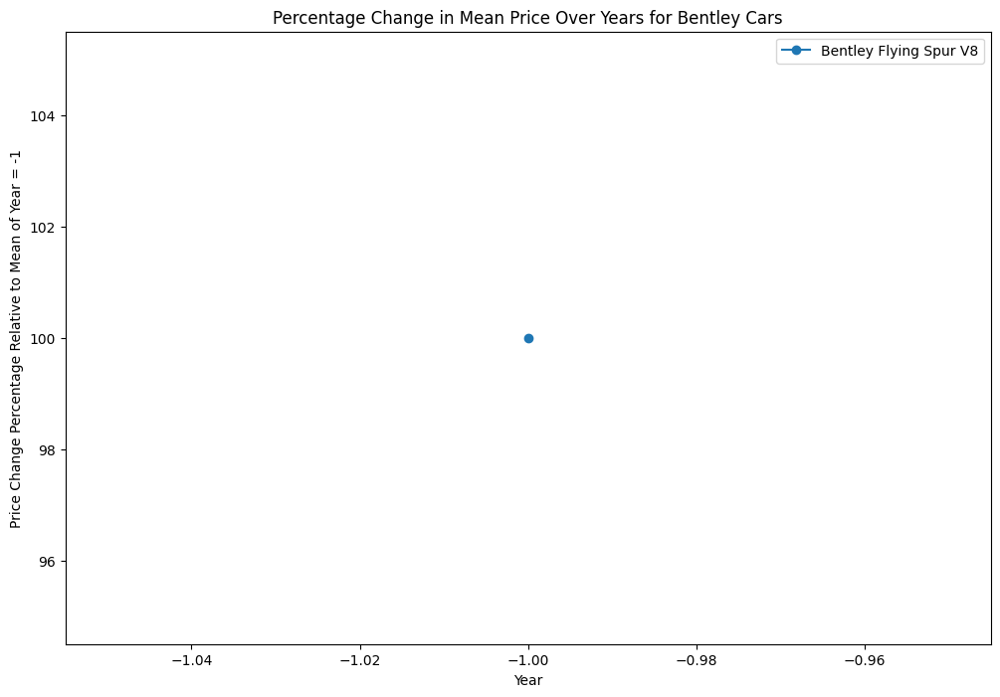

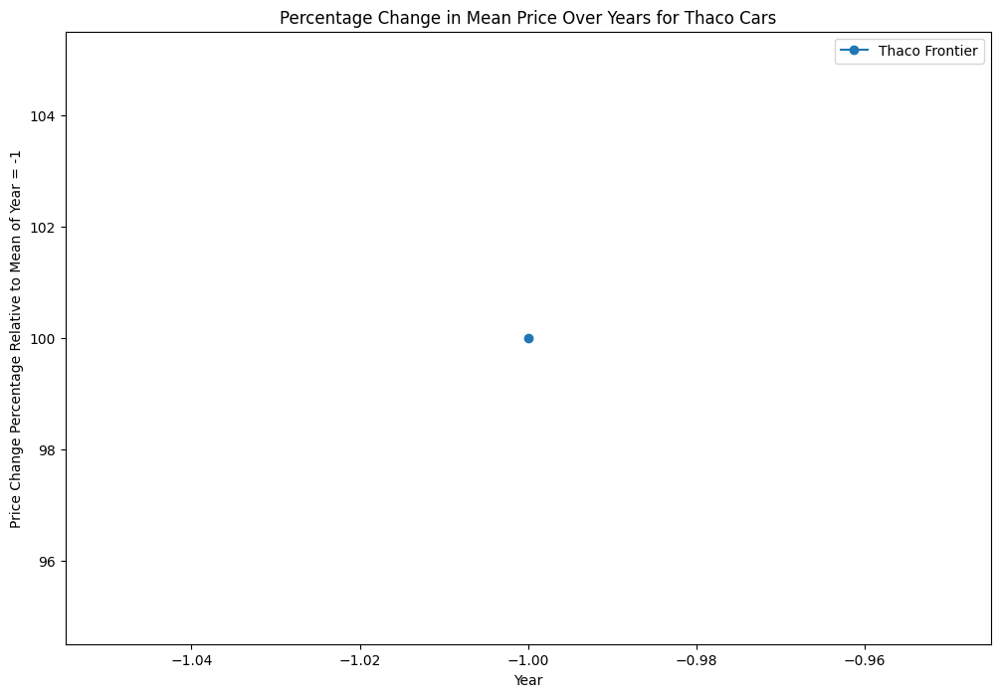

In [95]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'result_df' is your DataFrame
# Convert 'year' column to integer (if not already)
result_df['year'] = result_df['year'].astype(int)

# Get all unique car names and brands
unique_car_names = result_df['car_name'].unique()
unique_brands = result_df['brand'].unique()

for brand_filter in unique_brands:
    plt.figure(figsize=(12, 8))
    plt.title(f'Percentage Change in Mean Price Over Years for {brand_filter} Cars')
    plt.xlabel('Year')
    plt.ylabel('Price Change Percentage Relative to Mean of Year = -1')

    for car_name_filter in unique_car_names:
        # Filter the DataFrame for the specific car_name and brand
        filtered_df = result_df[(result_df['car_name'] == car_name_filter) & (result_df['brand'] == brand_filter)]

        # Calculate the mean price for each year
        mean_prices = filtered_df.groupby('year')['price'].mean()

        # Check if mean_prices is not empty
        if not mean_prices.empty:
            # Interpolate missing values
            mean_prices = mean_prices.reindex(range(mean_prices.index.min(), mean_prices.index.max() + 1))
            mean_prices = mean_prices.interpolate(method='linear')

            # Calculate the percentage change relative to the mean of year == -1
            mean_prices_relative = (mean_prices / mean_prices.iloc[0]) * 100

            # Create the plot
            label = f'{car_name_filter}'
            plt.plot(mean_prices_relative.index, mean_prices_relative, marker='o', linestyle='-', label=label)

    plt.legend()
    plt.show()


In [96]:
result_df[result_df['car_name'] == 'Audi A8 L 55 TFSI Quattro']

,car_name,year,price,assemble_place,series,driven kms,num_of_door,num_of_seat,engine_type,transmission,url,brand,brand_segment
2914,Audi A8 L 55 TFSI Quattro,1,5.990000e+09,1,Sedan,2000.0,4.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-audi-a8-l-55-tfsi-quatt...,Audi,PREMIUM
1197,Audi A8 L 55 TFSI Quattro,-1,4.783000e+09,Xe nhập khẩu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Audi,NaN
2892,Audi A8 L 55 TFSI Quattro,-1,5.762000e+09,Xe nhập khẩu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Audi,NaN
2923,Audi A8 L 55 TFSI Quattro,-1,4.783000e+09,Xe nhập khẩu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Audi,NaN
3130,Audi A8 L 55 TFSI Quattro,-1,5.762000e+09,Xe nhập khẩu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Audi,NaN
3950,Audi A8 L 55 TFSI Quattro,-1,4.783000e+09,Xe nhập khẩu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Audi,NaN


In [97]:
df_car[df_car['price'] == 0]

,price,assemble_place,car_name,brand,year


In [98]:
result_df[result_df['car_name'] == 'Lexus LX 600 Vip']

,car_name,year,price,assemble_place,series,driven kms,num_of_door,num_of_seat,engine_type,transmission,url,brand,brand_segment
10915,Lexus LX 600 Vip,1,1.250000e+10,1,SUV,2600.0,5.0,4.0,Xăng,Số tự động,https://bonbanh.com/xe-lexus-lx-600-vip-2022-4...,Lexus,LUXURY
23874,Lexus LX 600 Vip,1,1.245600e+10,1,SUV,3689.0,5.0,4.0,Xăng,Số tự động,https://bonbanh.com/xe-lexus-lx-600-vip-2022-4...,Lexus,LUXURY
4,Lexus LX 600 Vip,-1,1.059100e+10,Xe nhập khẩu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Lexus,NaN
91,Lexus LX 600 Vip,-1,1.059100e+10,Xe nhập khẩu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Lexus,NaN
227,Lexus LX 600 Vip,-1,1.059100e+10,Xe nhập khẩu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Lexus,NaN
471,Lexus LX 600 Vip,-1,1.059100e+10,Xe nhập khẩu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Lexus,NaN
489,Lexus LX 600 Vip,-1,1.059100e+10,Xe nhập khẩu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Lexus,NaN
833,Lexus LX 600 Vip,-1,1.135000e+10,Xe nhập khẩu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Lexus,NaN
913,Lexus LX 600 Vip,-1,1.059100e+10,Xe nhập khẩu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Lexus,NaN
1092,Lexus LX 600 Vip,-1,1.059100e+10,Xe nhập khẩu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Lexus,NaN


In [99]:
df_car[df_car['price'] == 0]

,price,assemble_place,car_name,brand,year


In [100]:
df_final = pd.concat([df_car,df])
df_final

,price,assemble_place,car_name,brand,year,series,driven kms,num_of_door,num_of_seat,engine_type,transmission,url,brand_segment
0,1.305900e+09,Xe nhập khẩu,Skoda Kodiaq Ambition 1.4 TSI Tur,Skoda,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,6.074000e+08,Xe nhập khẩu,Mitsubishi Xpander 1.5 AT,Mitsubishi,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2.328900e+09,Xe nhập khẩu,Volkswagen Teramont 2.0 AT,Volkswagen,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.059100e+10,Xe nhập khẩu,Lexus LX 600 Vip,Lexus,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,4.435000e+08,Xe nhập khẩu,Toyota Wigo G 1.2 AT,Toyota,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
26898,5.150000e+08,1,Suzuki Swift GLX 1.2 AT,Suzuki,2.0,Hatchback,3000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-suzuki-swift-glx-1.2-at...,LOWEND
26899,3.850000e+08,0,Hyundai i10 Grand 1.2 AT,Hyundai,3.0,Hatchback,20000.0,5.0,5.0,Xăng,Số tự động,https://bonbanh.com/xe-hyundai-i10-grand-1.2-a...,VOLUME
26900,6.790000e+08,1,Toyota Rush 1.5S AT,Toyota,4.0,SUV,60000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-toyota-rush-1.5s-at-201...,VOLUME
26901,1.500000e+09,1,Lexus GX 460,Lexus,13.0,SUV,60000.0,5.0,7.0,Xăng,Số tự động,https://bonbanh.com/xe-lexus-gx-460-2010-4557366,LUXURY


In [101]:
df_final = df_final[df_final['year'] != -1]

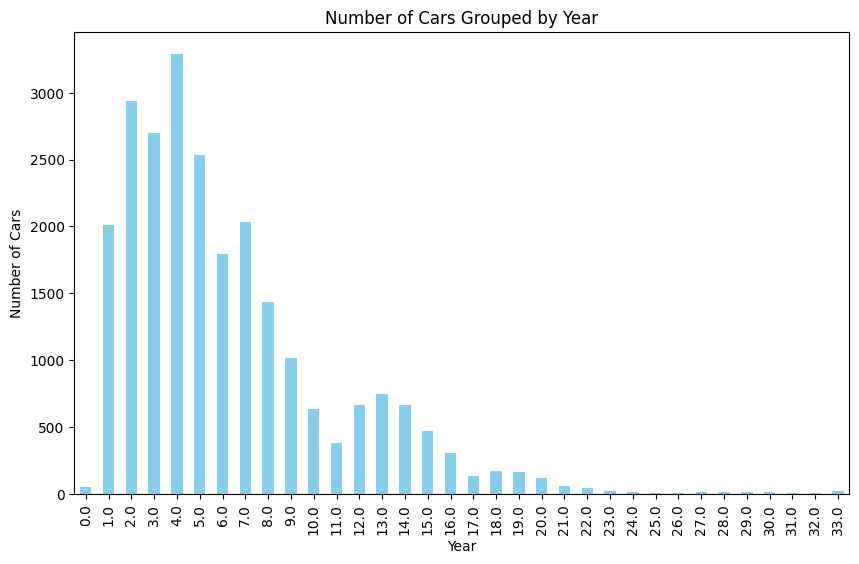

In [102]:
plt.figure(figsize=(10, 6))
df_final['year'].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title('Number of Cars Grouped by Year')
plt.xlabel('Year')
plt.ylabel('Number of Cars')
plt.show()

In [103]:
df['car_name'].value_counts()

car_name
Mazda 3 1.5 AT                       351
Mercedes Benz GLC 300 4Matic         333
Toyota Vios 1.5G                     318
Toyota Innova 2.0E                   296
Ford Ranger XLS 2.2L 4x2 AT          271
                                    ... 
Toyota Prado Vx                        1
Mercedes Benz E class E240 AT          1
Lexus RX 330                           1
Kia Sportage Signature 2.0G            1
Mercedes Benz S class S400 Hybrid      1
Name: count, Length: 1905, dtype: int64

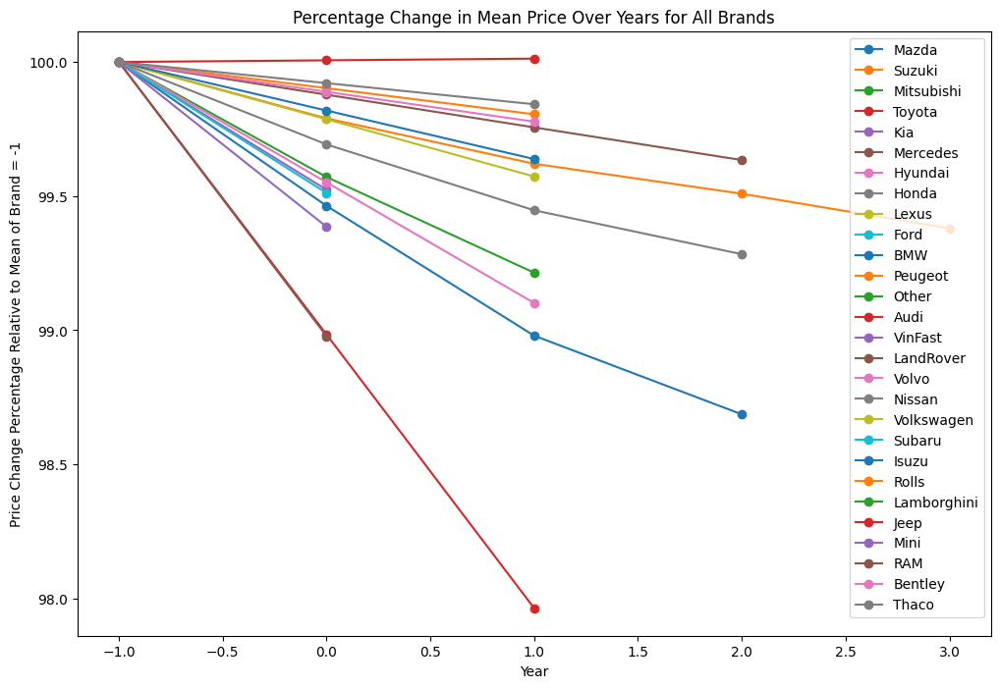

In [104]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'result_df' is your DataFrame
# Convert 'year' column to integer (if not already)
result_df['year'] = result_df['year'].astype(int)

# Get all unique car names and brands
unique_car_names = result_df['car_name'].unique()
unique_brands = result_df['brand'].unique()

plt.figure(figsize=(12, 8))
plt.title('Percentage Change in Mean Price Over Years for All Brands')
plt.xlabel('Year')
plt.ylabel('Price Change Percentage Relative to Mean of Brand = -1')

for brand_filter in unique_brands:
    brand_mean_prices_relative = None

    for car_name_filter in unique_car_names:
        # Filter the DataFrame for the specific car_name and brand
        filtered_df = result_df[(result_df['car_name'] == car_name_filter) & (result_df['brand'] == brand_filter)]

        # Calculate the mean price for each year
        mean_prices = filtered_df.groupby('year')['price'].mean()

        # Check if mean_prices is not empty
        if not mean_prices.empty:
            # Interpolate missing values
            mean_prices = mean_prices.reindex(range(mean_prices.index.min(), mean_prices.index.max() + 1))
            mean_prices = mean_prices.interpolate(method='linear')

            # Calculate the percentage change relative to the mean of brand == -1
            mean_prices_relative = (mean_prices / mean_prices.iloc[0]) * 100

            # Save the mean percentage change for the first car under the brand
            if brand_mean_prices_relative is None:
                brand_mean_prices_relative = mean_prices_relative
            else:
                brand_mean_prices_relative += mean_prices_relative

    # Calculate the mean percentage change across all cars for the brand
    brand_mean_prices_relative /= len(unique_car_names)

    # Offset the entire series to start at 100%
    brand_mean_prices_relative += (100 - brand_mean_prices_relative.iloc[0])

    # Create the plot for the brand
    label = f'{brand_filter}'
    plt.plot(brand_mean_prices_relative.index, brand_mean_prices_relative, marker='o', linestyle='-', label=label)

plt.legend()
plt.show()

